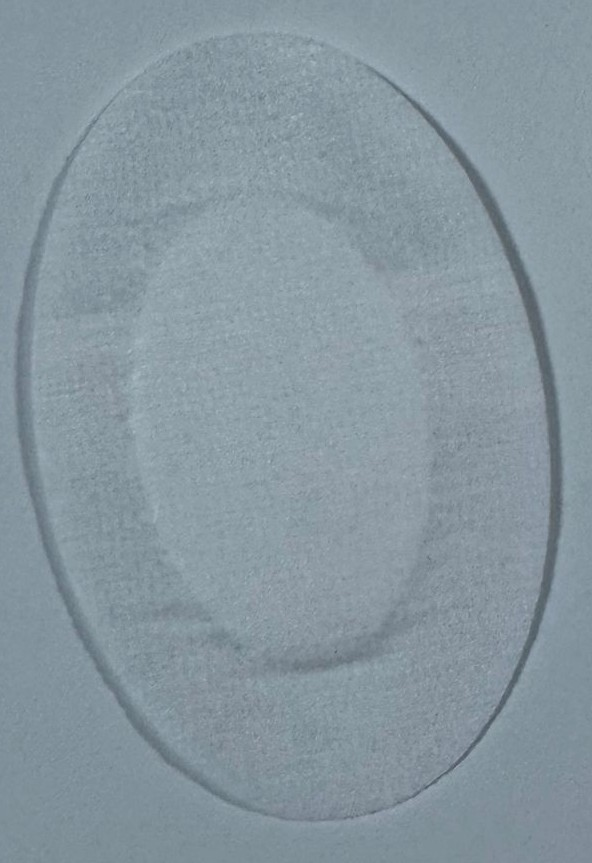

In [8]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("pad_clean.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.medianBlur(gray, 5)

# Çemberleri bul
circles = cv2.HoughCircles(blur, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30,
                           param1=100, param2=30, minRadius=50, maxRadius=130)

output = img.copy()
if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        cv2.circle(output, (i[0], i[1]), i[2], (0, 255, 0), 2)
        cv2.circle(output, (i[0], i[1]), 2, (0, 0, 255), 3)

cv2_imshow(output)

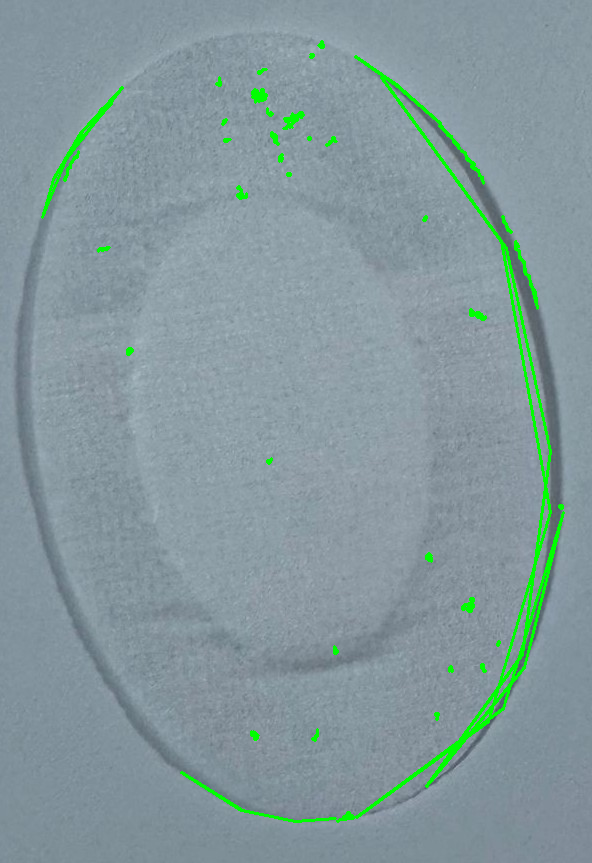

In [2]:

edges = cv2.Canny(gray, 50, 150)
contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

output2 = img.copy()
for cnt in contours:
    epsilon = 0.01 * cv2.arcLength(cnt, True)
    approx = cv2.approxPolyDP(cnt, epsilon, True)
    cv2.drawContours(output2, [approx], 0, (0, 255, 0), 2)

cv2_imshow(output2)


In [3]:
moments = cv2.moments(contours[0])
cx = int(moments['m10']/moments['m00'])
cy = int(moments['m01']/moments['m00'])

h, w = img.shape[:2]
ideal_center = (w//2, h//2)
offset = ((cx - ideal_center[0])**2 + (cy - ideal_center[1])**2)**0.5

print("🔍 Merkez kayması (piksel):", offset)


🔍 Merkez kayması (piksel): 387.3719143149126




---



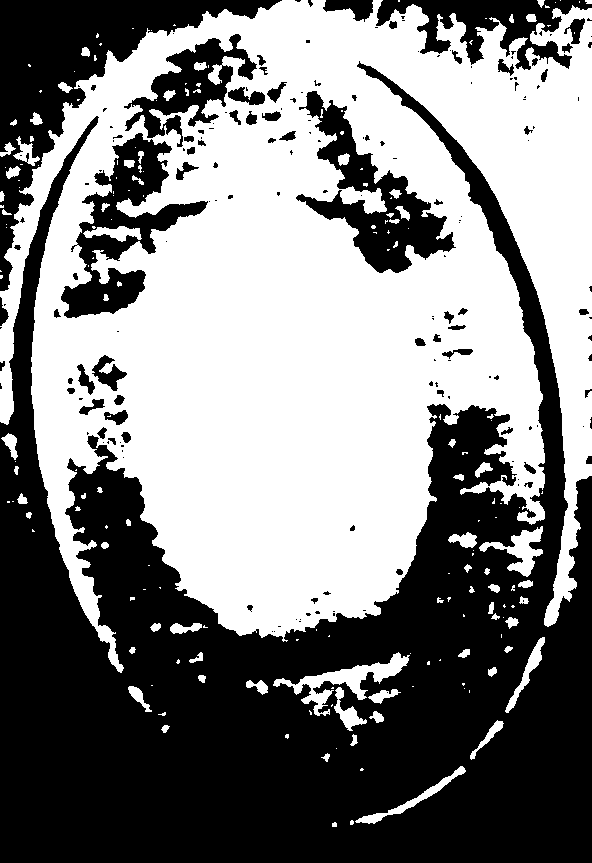

In [17]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("pad_clean.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Gürültüleri sil ama kenarları koru
blur = cv2.medianBlur(gray, 9)

# Histogram eşitleme (daha kontrollü kontrast)
equalized = cv2.equalizeHist(blur)

# Otsu Threshold (otomatik eşik)
_, thresh = cv2.threshold(equalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

cv2_imshow(thresh)


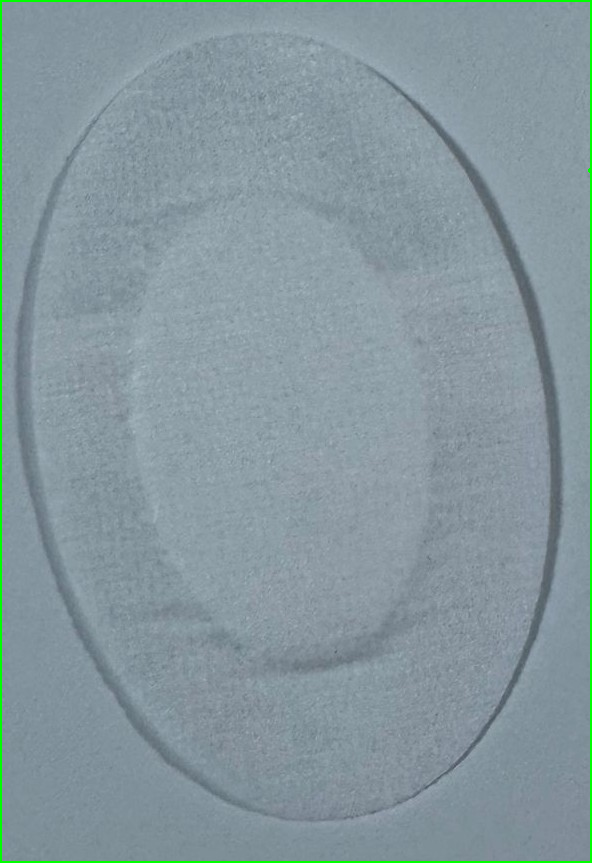

In [14]:
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Alanı en büyük olan konturu al
main_contour = max(contours, key=cv2.contourArea)

output = img.copy()
cv2.drawContours(output, [main_contour], -1, (0, 255, 0), 2)
cv2_imshow(output)


Elips: ((295.4965515136719, 430.38250732421875), (588.5203857421875, 9390.9091796875), 179.9995880126953)


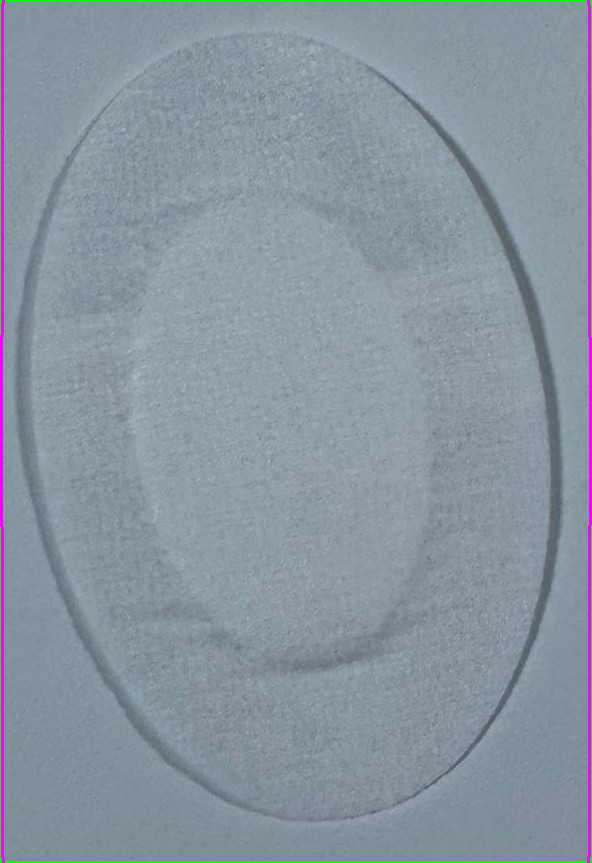

In [16]:
if len(main_contour) >= 5:
    ellipse = cv2.fitEllipse(main_contour)
    cv2.ellipse(output, ellipse, (255, 0, 255), 2)
    print("Elips:", ellipse)
cv2_imshow(output)


📐 Merkez kayması (piksel): 71.02816342831905
📏 Eksen oranı (simetri): 1.285


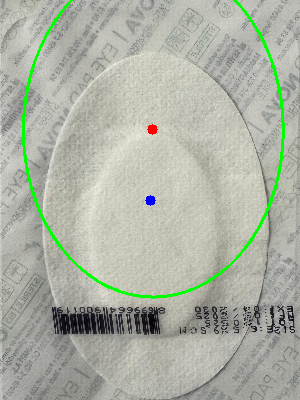

In [18]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# 1. Fotoğrafı yükle
img = cv2.imread("pad_paketli.jpg")
img = cv2.resize(img, (600, 800))  # boyut sabitleme

# 2. ROI (pedin ortada olduğu varsayımıyla kırp)
roi = img[200:600, 150:450]  # manuel bölge (görüntüye göre ayarlanabilir)

# 3. Griye çevir, blur, histogram eşitle
gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)
equalized = cv2.equalizeHist(blur)

# 4. Threshold + morfolojik açma (yazı ve barkodu bastırmak için)
_, thresh = cv2.threshold(equalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
kernel = np.ones((5,5), np.uint8)
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

# 5. Kontur bul → en büyük olanı seç
contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
main = max(contours, key=cv2.contourArea)

# 6. Elips oturt (en az 5 nokta varsa)
output = roi.copy()
if len(main) >= 5:
    ellipse = cv2.fitEllipse(main)
    cv2.ellipse(output, ellipse, (0,255,0), 2)

    # Elips merkezi vs. ROI merkezi
    (xc, yc), (MA, ma), angle = ellipse
    h, w = roi.shape[:2]
    roi_center = (w//2, h//2)
    ped_center = (int(xc), int(yc))
    offset = np.sqrt((ped_center[0] - roi_center[0])**2 + (ped_center[1] - roi_center[1])**2)

    # Merkezleri işaretle
    cv2.circle(output, roi_center, 5, (255,0,0), -1)  # ideal merkez (mavi)
    cv2.circle(output, ped_center, 5, (0,0,255), -1)  # tespit edilen merkez (kırmızı)

    print("📐 Merkez kayması (piksel):", offset)
    print("📏 Eksen oranı (simetri):", round(ma/MA, 3))
else:
    print("❌ Elips çizmek için yeterli kontur noktası yok.")

# 7. Sonuçları göster
cv2_imshow(output)


Elips 1 → Kayma: 113.69 px, Simetri oranı: 1.44
Elips 2 → Kayma: 166.69 px, Simetri oranı: 2.643


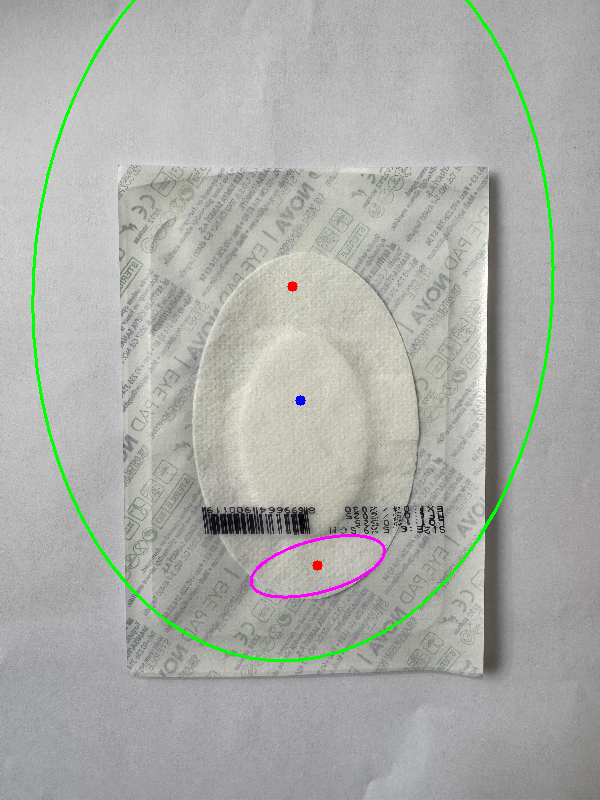

In [19]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Görseli oku ve boyutlandır
img = cv2.imread("pad_paketli.jpg")
img = cv2.resize(img, (600, 800))

# Griye çevir ve bulanıklaştır
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)

# Eşikleme (Otsu ile)
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Morfolojik açma (gürültü bastırma)
kernel = np.ones((5,5), np.uint8)
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

# Konturları bul
contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Alanına göre sırala ve en büyük 2 konturu al (dış ve iç halka)
sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]

# Çıkış görüntüsü
output = img.copy()

# ROI merkezi
h, w = img.shape[:2]
center_img = (w//2, h//2)
cv2.circle(output, center_img, 5, (255, 0, 0), -1)  # Görüntü merkezi

for i, cnt in enumerate(sorted_contours):
    if len(cnt) >= 5:
        ellipse = cv2.fitEllipse(cnt)
        cv2.ellipse(output, ellipse, (0, 255, 0) if i == 0 else (255, 0, 255), 2)

        # Merkez farkı
        (xc, yc), (MA, ma), angle = ellipse
        center_pad = (int(xc), int(yc))
        offset = np.sqrt((xc - center_img[0])**2 + (yc - center_img[1])**2)

        # Nokta olarak göster
        cv2.circle(output, center_pad, 5, (0, 0, 255), -1)

        print(f"Elips {i+1} → Kayma: {round(offset, 2)} px, Simetri oranı: {round(ma/MA, 3)}")

cv2_imshow(output)


Elips 1 → Kayma: 166.69 px, Simetri oranı: 2.643
Elips 2 → Kayma: 366.0 px, Simetri oranı: 2.958


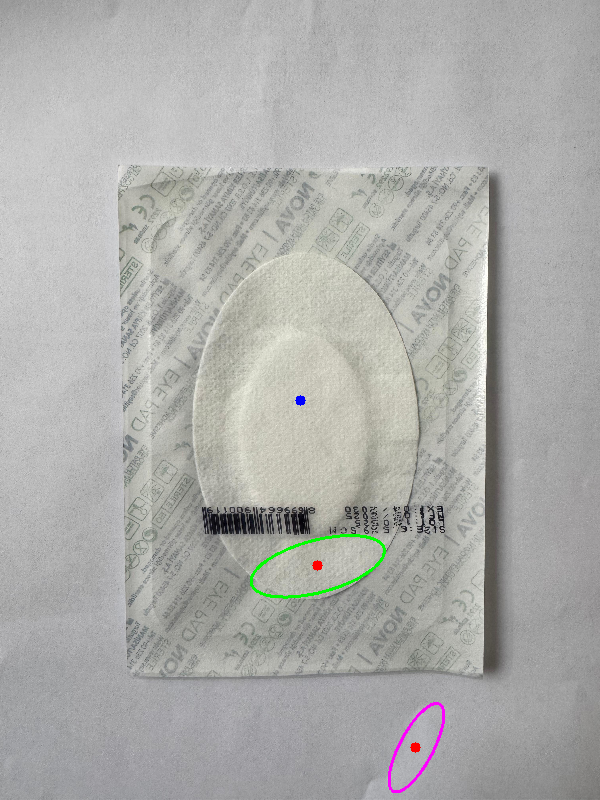

In [20]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("pad_paketli.jpg")
img = cv2.resize(img, (600, 800))
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, np.ones((5,5), np.uint8))

contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

output = img.copy()
h, w = img.shape[:2]
center_img = (w//2, h//2)
cv2.circle(output, center_img, 5, (255, 0, 0), -1)

# ✅ Filtrelenmiş konturlar: sadece gerçek ped boyutlarında olanlar
filtered_contours = [cnt for cnt in contours if 1000 < cv2.contourArea(cnt) < 100000]

# Alan büyükten küçüğe sırala
filtered_contours = sorted(filtered_contours, key=cv2.contourArea, reverse=True)

for i, cnt in enumerate(filtered_contours[:2]):  # sadece ilk 2 kontur
    if len(cnt) >= 5:
        ellipse = cv2.fitEllipse(cnt)
        cv2.ellipse(output, ellipse, (0, 255, 0) if i == 0 else (255, 0, 255), 2)

        (xc, yc), (MA, ma), _ = ellipse
        center_pad = (int(xc), int(yc))
        offset = np.sqrt((xc - center_img[0])**2 + (yc - center_img[1])**2)
        cv2.circle(output, center_pad, 5, (0, 0, 255), -1)

        print(f"Elips {i+1} → Kayma: {round(offset, 2)} px, Simetri oranı: {round(ma/MA, 3)}")

cv2_imshow(output)


Elips 1 → Kayma: 45.36 px, Simetri oranı: 1.26
Elips 2 → Kayma: 166.66 px, Simetri oranı: 2.642


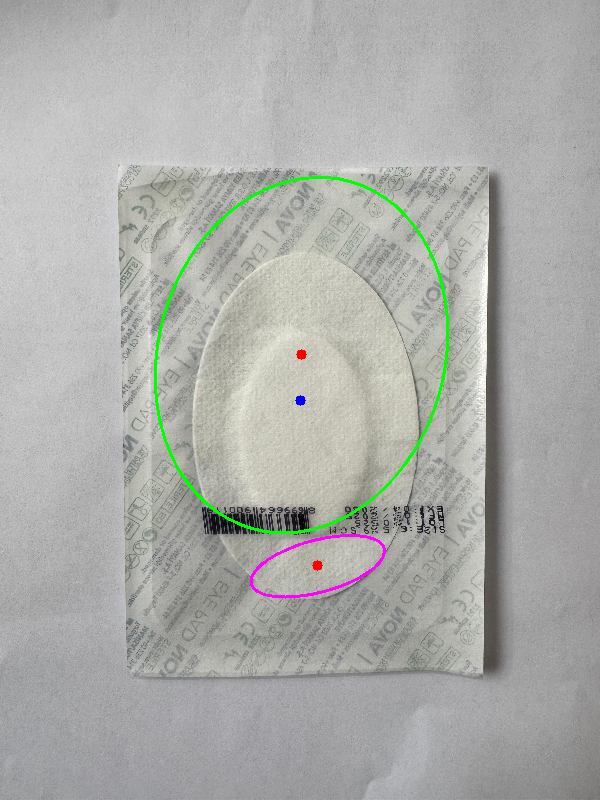

In [21]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Görseli yükle
img = cv2.imread("pad_paketli.jpg")
img = cv2.resize(img, (600, 800))
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, np.ones((5,5), np.uint8))

# Görüntü merkezini bul
h, w = img.shape[:2]
center_img = (w//2, h//2)

# 🎯 Yeni: Maske oluştur (sadece merkezdeki 300x400 bölgeyi al)
mask = np.zeros_like(opened)
cv2.rectangle(mask, (w//2 - 150, h//2 - 200), (w//2 + 150, h//2 + 200), 255, -1)
masked = cv2.bitwise_and(opened, opened, mask=mask)

# Kontur bul
contours, _ = cv2.findContours(masked, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Alan filtresi uygula
filtered = [cnt for cnt in contours if 1000 < cv2.contourArea(cnt) < 90000]
filtered = sorted(filtered, key=cv2.contourArea, reverse=True)

output = img.copy()
cv2.circle(output, center_img, 5, (255, 0, 0), -1)

for i, cnt in enumerate(filtered[:2]):
    if len(cnt) >= 5:
        ellipse = cv2.fitEllipse(cnt)
        cv2.ellipse(output, ellipse, (0,255,0) if i==0 else (255,0,255), 2)

        (xc, yc), (MA, ma), _ = ellipse
        center_pad = (int(xc), int(yc))
        offset = np.sqrt((xc - center_img[0])**2 + (yc - center_img[1])**2)
        cv2.circle(output, center_pad, 5, (0, 0, 255), -1)

        print(f"Elips {i+1} → Kayma: {round(offset, 2)} px, Simetri oranı: {round(ma/MA, 3)}")

cv2_imshow(output)


Elips 1 → Kayma: 166.69 px, Simetri oranı: 2.643, Circularity: 0.426


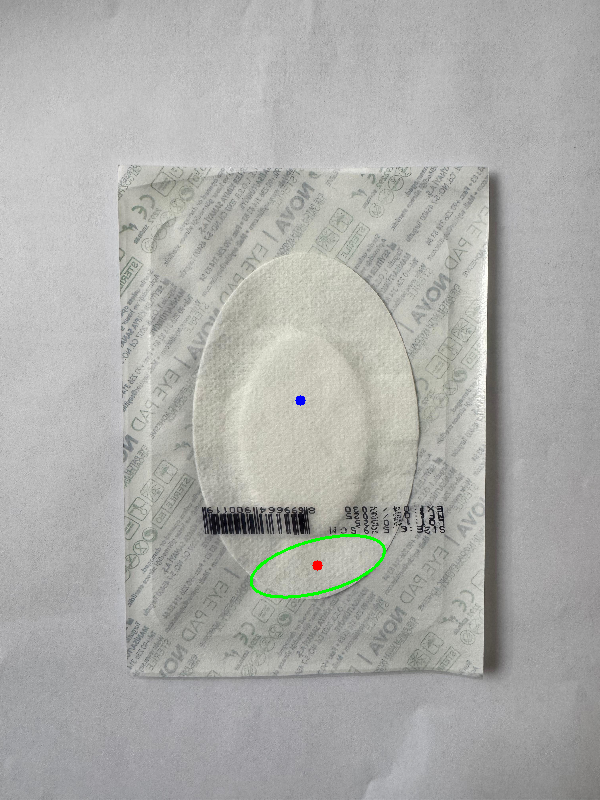

In [22]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("pad_paketli.jpg")
img = cv2.resize(img, (600, 800))
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, np.ones((5,5), np.uint8))

# Görüntü merkezi
h, w = img.shape[:2]
center = (w//2, h//2)

# Tüm konturları bul
contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# En yakın merkezli ve düzgün şekilli 2 kontur bul
candidates = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area < 3000 or area > 100000:
        continue
    M = cv2.moments(cnt)
    if M['m00'] == 0: continue
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    distance = np.sqrt((cx - center[0])**2 + (cy - center[1])**2)

    # Yuvarlaklık metriği = 4πA / P² → 1'e yakınsa elips/çember
    perimeter = cv2.arcLength(cnt, True)
    circularity = 4 * np.pi * area / (perimeter ** 2)
    candidates.append((cnt, distance, circularity))

# Merkeze en yakın + düzgün olan ilk 2 konturu al
candidates = sorted(candidates, key=lambda x: (x[1], -x[2]))[:2]

output = img.copy()
colors = [(0,255,0), (255,0,255)]

for i, (cnt, dist, circ) in enumerate(candidates):
    ellipse = cv2.fitEllipse(cnt)
    cv2.ellipse(output, ellipse, colors[i], 2)

    (xc, yc), (MA, ma), _ = ellipse
    center_pad = (int(xc), int(yc))
    offset = np.sqrt((xc - center[0])**2 + (yc - center[1])**2)
    ratio = round(ma/MA, 3)

    cv2.circle(output, center_pad, 5, (0,0,255), -1)
    print(f"Elips {i+1} → Kayma: {round(offset,2)} px, Simetri oranı: {ratio}, Circularity: {round(circ,3)}")

cv2.circle(output, center, 5, (255,0,0), -1)
cv2_imshow(output)


Elips 1 (alan sırası): merkez = (317, 565), eksen oranı = 2.643


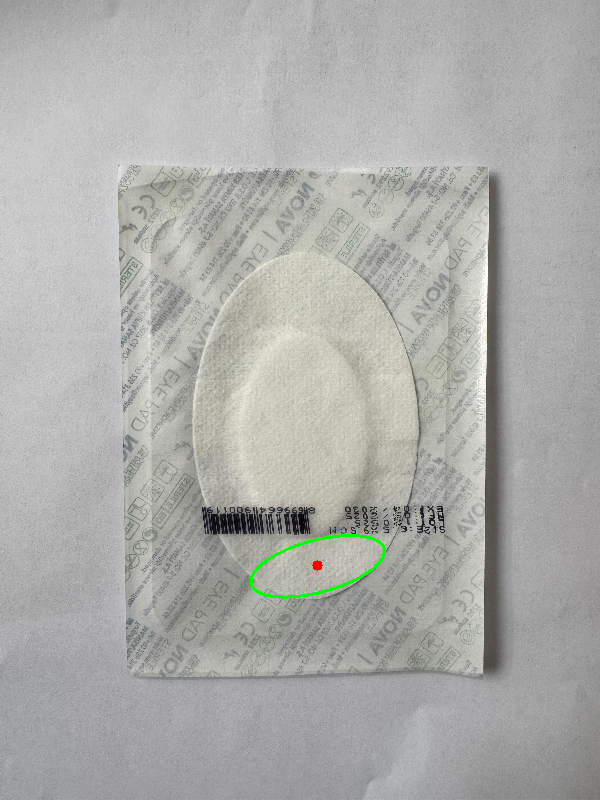

In [23]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# 1. Görseli oku
img = cv2.imread("pad_paketli.jpg")
img = cv2.resize(img, (600, 800))
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)
_, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, np.ones((5,5), np.uint8))

# 2. Tüm konturları bul
contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 3. Alan filtresi uygula
contours = [cnt for cnt in contours if 5000 < cv2.contourArea(cnt) < 100000]

# 4. Alanı büyükten küçüğe sırala (dış > iç)
contours = sorted(contours, key=cv2.contourArea, reverse=True)

output = img.copy()

# 5. Sadece ilk 2 kontur ile elips oturt
ellipses = []
for i, cnt in enumerate(contours[:2]):
    if len(cnt) >= 5:
        ellipse = cv2.fitEllipse(cnt)
        ellipses.append(ellipse)
        color = (0, 255, 0) if i == 0 else (255, 0, 255)  # yeşil: dış, mor: iç
        cv2.ellipse(output, ellipse, color, 2)

        # Elips merkezi
        center = (int(ellipse[0][0]), int(ellipse[0][1]))
        cv2.circle(output, center, 5, (0, 0, 255), -1)

        print(f"Elips {i+1} (alan sırası): merkez = {center}, eksen oranı = {round(ellipse[1][1]/ellipse[1][0], 3)}")

cv2_imshow(output)


yolov8


---



In [24]:
!pip install ultralytics --quiet
from ultralytics import YOLO


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 90.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 83.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 91.4 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralyti

In [2]:
# 1. Gerekli paketleri yükle
!pip install ultralytics --quiet
import zipfile, os
from ultralytics import YOLO

# 2. ZIP dosyasını çıkar
zip_path = "goz_pedi.v2i.yolov8.zip"
extract_path = "datasets/goz_pedi"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# 3. Modeli başlat ve eğitimi başlat
model = YOLO('yolov8n-seg.pt')  # hızlı segmentasyon için küçük model

model.train(
    data=f"{extract_path}/data.yaml",  # ZIP'ten çıkan yol
    epochs=50,
    imgsz=640,
    batch=8,
    name='goz_pedi_seg',
    task='segment'
)


100%|██████████| 6.74M/6.74M [00:00<00:00, 134MB/s]


Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=datasets/goz_pedi/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=goz_pedi_seg, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, p

100%|██████████| 755k/755k [00:00<00:00, 21.8MB/s]

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

YOLOv8n-seg summary: 151 layers, 3,264,006 parameters, 3,263,990 gradients, 12.1 GFLOPs

Transferred 381/417 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 97.4MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 999.4±507.5 MB/s, size: 49.4 KB)


train: Scanning /content/datasets/goz_pedi/train/labels... 5 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<00:00, 687.30it/s]

train: New cache created: /content/datasets/goz_pedi/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 467.7±71.5 MB/s, size: 49.1 KB)


val: Scanning /content/datasets/goz_pedi/valid/labels... 2 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2/2 [00:00<00:00, 11428.62it/s]

val: New cache created: /content/datasets/goz_pedi/valid/labels.cache


Plotting labels to runs/segment/goz_pedi_seg/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/goz_pedi_seg
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.953G      1.518      6.724      3.402       1.96         36        640: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all          2          4    0.00278        0.5      0.116     0.0894    0.00278        0.5      0.116     0.0199

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size



       2/50     0.994G      1.354      6.353      3.439      1.702         21        640: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.78it/s]

                   all          2          4     0.0028        0.5      0.112     0.0686     0.0028        0.5      0.112     0.0112



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50         1G      1.041      4.943      3.351      1.605         14        640: 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.73it/s]

                   all          2          4    0.00486       0.75      0.209      0.109    0.00284        0.5      0.146     0.0271



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.01G      1.185      6.996      3.111       1.62         30        640: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.72it/s]

                   all          2          4    0.00287        0.5      0.155      0.095    0.00287        0.5      0.155     0.0157



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.01G      1.099      6.557      3.219      1.627         21        640: 100%|██████████| 1/1 [00:00<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.37it/s]

                   all          2          4    0.00285        0.5      0.165      0.116    0.00285        0.5      0.165      0.029



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.02G      1.559      5.798      3.437      1.971         15        640: 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.41it/s]

                   all          2          4    0.00287        0.5      0.124     0.0869    0.00287        0.5      0.124     0.0207



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.03G      1.159      6.334       3.34      1.751         19        640: 100%|██████████| 1/1 [00:00<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.78it/s]

                   all          2          4    0.00287        0.5      0.121     0.0748    0.00287        0.5     0.0226    0.00247



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.03G      1.362      5.841      3.436      1.756         23        640: 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.76it/s]

                   all          2          4    0.00274        0.5      0.159       0.12    0.00274        0.5      0.159     0.0284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.07G      1.367        4.9      3.283      1.717         17        640: 100%|██████████| 1/1 [00:00<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.87it/s]

                   all          2          4    0.00274        0.5      0.159       0.12    0.00274        0.5      0.159     0.0284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50       1.1G     0.8728      4.744      3.067       1.42         19        640: 100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.07it/s]

                   all          2          4    0.00265        0.5      0.286      0.128    0.00265        0.5      0.162     0.0324



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.11G     0.9143       3.88      3.094      1.363         21        640: 100%|██████████| 1/1 [00:00<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.66it/s]

                   all          2          4    0.00265        0.5      0.286      0.128    0.00265        0.5      0.162     0.0324



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.14G     0.8193      4.382      2.955      1.336         22        640: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.66it/s]

                   all          2          4    0.00486       0.75      0.417      0.286    0.00275        0.5      0.414     0.0946



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.15G     0.9913      3.389      2.958      1.371         26        640: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.90it/s]

                   all          2          4    0.00486       0.75      0.417      0.286    0.00275        0.5      0.414     0.0946



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.18G     0.6468      3.393      2.782      1.198         24        640: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.55it/s]

                   all          2          4    0.00681          1      0.387       0.21    0.00486       0.75       0.25     0.0508



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.18G     0.8632      3.052      2.633      1.204         26        640: 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.58it/s]

                   all          2          4    0.00681          1      0.387       0.21    0.00486       0.75       0.25     0.0508



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.21G     0.8192      2.956      2.743      1.314         16        640: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.06it/s]

                   all          2          4    0.00672          1      0.466      0.295    0.00672          1      0.199     0.0539



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.22G      0.731      2.956      2.352       1.09         25        640: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.43it/s]

                   all          2          4    0.00672          1      0.466      0.295    0.00672          1      0.199     0.0539



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.25G      0.697      2.621      2.348      1.093         27        640: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.98it/s]

                   all          2          4    0.00668          1      0.546      0.414    0.00668          1       0.17     0.0868



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.26G     0.6552       2.45      2.409      1.124         20        640: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.47it/s]

                   all          2          4    0.00668          1      0.546      0.414    0.00668          1       0.17     0.0868



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.29G     0.5974      2.211      1.933     0.9934         24        640: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.78it/s]

                   all          2          4    0.00668          1      0.621      0.465    0.00668          1      0.253     0.0915



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.29G     0.5465      2.123      1.769     0.9633         25        640: 100%|██████████| 1/1 [00:00<00:00,  7.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.89it/s]

                   all          2          4    0.00668          1      0.621      0.465    0.00668          1      0.253     0.0915



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.32G     0.6545      2.135      1.866      1.088         24        640: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.16it/s]

                   all          2          4    0.00669          1      0.572      0.394    0.00669          1      0.415      0.199



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.33G     0.5818      1.367      1.639      1.083         22        640: 100%|██████████| 1/1 [00:00<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]

                   all          2          4    0.00669          1      0.572      0.394    0.00669          1      0.415      0.199



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.36G      0.592      1.977       2.09      1.027         15        640: 100%|██████████| 1/1 [00:00<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.34it/s]

                   all          2          4    0.00669          1      0.572      0.394    0.00669          1      0.415      0.199



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.38G      0.665      1.778      1.763      1.026         25        640: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.92it/s]

                   all          2          4    0.00669          1      0.746      0.596    0.00669          1      0.663      0.522



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.39G     0.6592      1.814       1.55      1.163         21        640: 100%|██████████| 1/1 [00:00<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.50it/s]

                   all          2          4    0.00669          1      0.746      0.596    0.00669          1      0.663      0.522



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.42G     0.4943      1.356      1.273     0.9918         23        640: 100%|██████████| 1/1 [00:00<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.43it/s]

                   all          2          4    0.00669          1      0.746      0.596    0.00669          1      0.663      0.522



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.43G     0.7359      2.154      1.466      1.155         22        640: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.65it/s]

                   all          2          4    0.00668          1      0.995      0.676    0.00668          1      0.704      0.503



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.44G     0.5123      1.346      1.192     0.9659         19        640: 100%|██████████| 1/1 [00:00<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.02it/s]

                   all          2          4    0.00668          1      0.995      0.676    0.00668          1      0.704      0.503



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.47G     0.5484      1.351      1.188      1.033         22        640: 100%|██████████| 1/1 [00:00<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.11it/s]

                   all          2          4    0.00668          1      0.995      0.676    0.00668          1      0.704      0.503



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.49G      0.634       1.46      1.328       1.08         24        640: 100%|██████████| 1/1 [00:00<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.89it/s]

                   all          2          4    0.00671          1      0.623      0.462    0.00671          1      0.623      0.399



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50       1.5G     0.4896      1.215      1.188     0.9761         25        640: 100%|██████████| 1/1 [00:00<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.85it/s]

                   all          2          4    0.00671          1      0.623      0.462    0.00671          1      0.623      0.399



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.53G     0.6174      1.251      1.343      1.161         24        640: 100%|██████████| 1/1 [00:00<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.01it/s]

                   all          2          4    0.00671          1      0.623      0.462    0.00671          1      0.623      0.399



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.55G     0.8729      1.857      1.736      1.342         19        640: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]

                   all          2          4    0.00671          1      0.501      0.413    0.00671          1      0.501      0.301



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.55G     0.4985      1.074      1.008     0.9878         27        640: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.33it/s]

                   all          2          4    0.00671          1      0.501      0.413    0.00671          1      0.501      0.301



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.58G     0.6638      1.591      1.377       1.09         19        640: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.47it/s]

                   all          2          4    0.00671          1      0.501      0.413    0.00671          1      0.501      0.301



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50       1.6G     0.5708      1.069      1.201      1.082         16        640: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.41it/s]

                   all          2          4    0.00671          1      0.501      0.413    0.00671          1      0.501      0.301



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.62G     0.4517       1.25        1.5      1.026         14        640: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.17it/s]

                   all          2          4      0.859        0.5      0.501      0.413      0.859        0.5      0.501      0.276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.63G     0.5334      1.093      1.054      1.014         22        640: 100%|██████████| 1/1 [00:00<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.01it/s]

                   all          2          4      0.859        0.5      0.501      0.413      0.859        0.5      0.501      0.276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.66G     0.4577      1.607      1.338      1.044         15        640: 100%|██████████| 1/1 [00:00<00:00,  7.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.06it/s]

                   all          2          4      0.859        0.5      0.501      0.413      0.859        0.5      0.501      0.276


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.68G     0.5643       1.23      1.356        1.1         10        640: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

                   all          2          4      0.859        0.5      0.501      0.413      0.859        0.5      0.501      0.276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50       1.7G     0.4547      1.621      1.779      1.005         10        640: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.59it/s]

                   all          2          4       0.92        0.5      0.501      0.413       0.92        0.5      0.501      0.326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50       1.7G      0.823      1.244      2.073      1.491         10        640: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.19it/s]

                   all          2          4       0.92        0.5      0.501      0.413       0.92        0.5      0.501      0.326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.73G     0.3682     0.9291      1.256     0.8757         10        640: 100%|██████████| 1/1 [00:00<00:00,  6.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.40it/s]

                   all          2          4       0.92        0.5      0.501      0.413       0.92        0.5      0.501      0.326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.75G     0.4169     0.9532      1.289      1.004         10        640: 100%|██████████| 1/1 [00:00<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.30it/s]

                   all          2          4       0.92        0.5      0.501      0.413       0.92        0.5      0.501      0.326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.77G     0.8821      1.457      2.198      1.375         10        640: 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.16it/s]

                   all          2          4      0.923        0.5      0.501      0.413      0.923        0.5      0.501      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.78G     0.3847     0.7617      1.259     0.9603         10        640: 100%|██████████| 1/1 [00:00<00:00,  7.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.06it/s]

                   all          2          4      0.923        0.5      0.501      0.413      0.923        0.5      0.501      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.81G     0.2911     0.7803       1.25     0.9174         10        640: 100%|██████████| 1/1 [00:00<00:00,  7.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.14it/s]

                   all          2          4      0.923        0.5      0.501      0.413      0.923        0.5      0.501      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.83G      0.494     0.9358      1.441      1.092         10        640: 100%|██████████| 1/1 [00:00<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.31it/s]

                   all          2          4      0.923        0.5      0.501      0.413      0.923        0.5      0.501      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.84G     0.3891     0.9355      1.255     0.9005         10        640: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.71it/s]

                   all          2          4      0.956        0.5      0.501      0.413      0.956        0.5      0.501      0.375



50 epochs completed in 0.008 hours.
Optimizer stripped from runs/segment/goz_pedi_seg/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/goz_pedi_seg/weights/best.pt, 6.8MB

Validating runs/segment/goz_pedi_seg/weights/best.pt...
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,454 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.89it/s]


                   all          2          4    0.00668          1      0.995      0.676    0.00668          1      0.704      0.503
          goz_pedi_dis          2          2    0.00641          1      0.995      0.671    0.00641          1      0.745      0.459
           goz_pedi_ic          2          2    0.00694          1      0.995       0.68    0.00694          1      0.663      0.547
Speed: 0.4ms preprocess, 11.7ms inference, 0.0ms loss, 5.3ms postprocess per image
Results saved to runs/segment/goz_pedi_seg


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ebae317f810>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104


image 1/1 /content/datasets/goz_pedi/train/images/WhatsApp-Gorsel-2025-05-21-saat-14_52_24_6aa622e5_jpg.rf.392bef4e833a9ce279f73bfda5a75b22.jpg: 640x640 (no detections), 10.3ms
Speed: 1.9ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
❌ Hiçbir nesne tespit edilemedi.


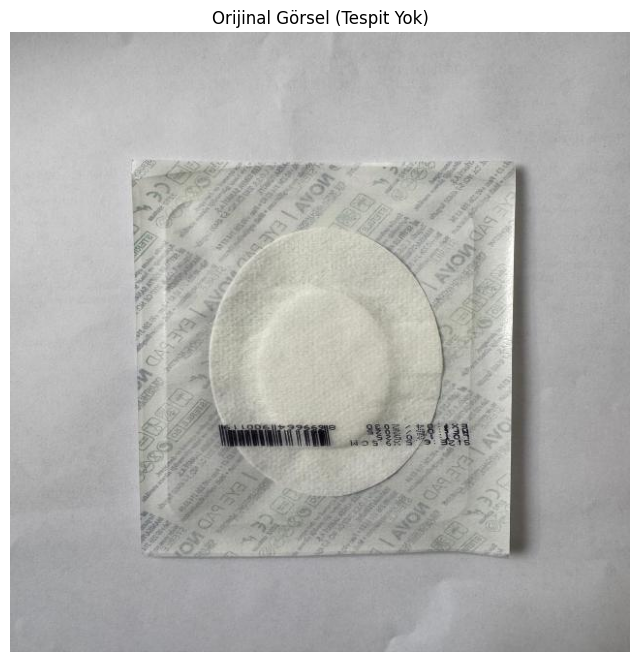

In [19]:
from ultralytics import YOLO
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Doğru modeli yükle (best.pt varsa onu, yoksa last.pt)
model = YOLO("runs/segment/goz_pedi_seg/weights/last.pt")

# Görseli tahmin et
results = model.predict("/content/datasets/goz_pedi/train/images/WhatsApp-Gorsel-2025-05-21-saat-14_52_24_6aa622e5_jpg.rf.392bef4e833a9ce279f73bfda5a75b22.jpg", conf=0.3)

# Görseli oku
img = cv2.imread("/content/datasets/goz_pedi/train/images/WhatsApp-Gorsel-2025-05-21-saat-14_52_24_6aa622e5_jpg.rf.392bef4e833a9ce279f73bfda5a75b22.jpg")
output = img.copy()

# Hiç tespit yoksa bile göster
if results[0].masks is None:
    print("❌ Hiçbir nesne tespit edilemedi.")
else:
    masks = results[0].masks.data.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()
    names = model.names

    for i, mask in enumerate(masks):
        cls_name = names[int(classes[i])]
        binary = (mask * 255).astype(np.uint8)
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours and len(contours[0]) >= 5:
            ellipse = cv2.fitEllipse(contours[0])
            center = tuple(map(int, ellipse[0]))
            ratio = round(ellipse[1][1] / ellipse[1][0], 3)

            cv2.ellipse(output, ellipse, (0, 255, 0), 2)
            cv2.circle(output, center, 5, (0, 0, 255), -1)
            cv2.putText(output, f"{cls_name}: {center}, oran: {ratio}",
                        (10, 30 + i * 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 255), 2)

# Her durumda göster
plt.figure(figsize=(8, 10))
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Model Tahmini" if results[0].masks else "Orijinal Görsel (Tespit Yok)")
plt.show()


In [24]:
# 📦 Gerekli kütüphaneleri yükle
!pip install ultralytics --upgrade -q

# 📂 Dataset'i yüklediysen, bunu çalıştır (veya Google Drive'dan yükleyebilirsin)
import zipfile
import os

zip_path = "/content/goz_pedi.v3i.yolov8.zip"  # kendi zip dosyanın yolunu buraya yaz
extract_to = "/content/datasets/goz_pedi"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# ✅ Modeli yükle (segmentasyon için önceden eğitilmiş model)
from ultralytics import YOLO

model = YOLO("yolov8n-seg.pt")  # n = nano model

# ✅ Eğitimi başlat
model.train(
    data=f"{extract_to}/data.yaml",
    epochs=50,
    imgsz=640,
    task="segment",
    name="goz_pedi_seg",
    batch=2,
    patience=20,
    optimizer="Adam",
    verbose=True
)


Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/goz_pedi/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=goz_pedi_seg3, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=20, perspective=0.0, plots=True, pos

train: Scanning /content/datasets/goz_pedi/train/labels... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<00:00, 1477.08it/s]

train: New cache created: /content/datasets/goz_pedi/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 455.2±53.8 MB/s, size: 63.3 KB)


val: Scanning /content/datasets/goz_pedi/valid/labels... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 876.05it/s]

val: New cache created: /content/datasets/goz_pedi/valid/labels.cache


Plotting labels to runs/segment/goz_pedi_seg3/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/goz_pedi_seg3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.564G      1.294      5.826      3.353      1.698         10        640: 100%|██████████| 10/10 [00:01<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.56it/s]

                   all          4          8    0.00386      0.625      0.173        0.1    0.00286        0.5     0.0827     0.0088



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.658G      1.299      6.029      3.316      1.758          5        640: 100%|██████████| 10/10 [00:00<00:00, 10.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.44it/s]


                   all          4          8    0.00393      0.625      0.135     0.0654    0.00224      0.375     0.0774    0.00862

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.658G      1.961      6.155      3.344       2.15          4        640: 100%|██████████| 10/10 [00:00<00:00, 10.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.91it/s]

                   all          4          8      0.507       0.25     0.0224    0.00476          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.658G      2.702      6.756      3.497      2.506          4        640: 100%|██████████| 10/10 [00:01<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.10it/s]

                   all          4          8     0.0013      0.375    0.00763    0.00268          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.658G      2.677      9.563      3.691      2.613         10        640: 100%|██████████| 10/10 [00:00<00:00, 10.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.69it/s]

                   all          4          8     0.0013      0.375    0.00763    0.00268          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.658G      2.892      10.94      4.005      2.755          5        640: 100%|██████████| 10/10 [00:01<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.19it/s]

                   all          4          8    0.00197        0.5    0.00415    0.00114          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.658G      2.885      8.847      3.787      2.727         10        640: 100%|██████████| 10/10 [00:01<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.63it/s]

                   all          4          8    0.00197        0.5    0.00415    0.00114          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.658G      2.862      7.991      3.966      2.828         12        640: 100%|██████████| 10/10 [00:00<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.09it/s]

                   all          4          8    0.00245        0.5     0.0165    0.00246          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.658G      3.002      8.892      3.946       2.81          6        640: 100%|██████████| 10/10 [00:00<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.43it/s]

                   all          4          8    0.00245        0.5     0.0165    0.00246          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.658G        2.9      9.879      4.238      2.828          4        640: 100%|██████████| 10/10 [00:00<00:00, 10.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.74it/s]

                   all          4          8    0.00245        0.5     0.0165    0.00246          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.658G       2.94      10.11      4.415      2.836          5        640: 100%|██████████| 10/10 [00:00<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]

                   all          4          8    0.00245        0.5     0.0165    0.00246          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.658G      2.745      7.091      3.788       2.73          8        640: 100%|██████████| 10/10 [00:00<00:00, 10.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]


                   all          4          8          0          0          0          0          0          0          0          0

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.658G       2.85      6.024      3.756      2.875          5        640: 100%|██████████| 10/10 [00:00<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.14it/s]

                   all          4          8          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.672G      2.769      6.028      3.647      2.964          5        640: 100%|██████████| 10/10 [00:00<00:00, 10.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.11it/s]

                   all          4          8          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.672G      3.061      5.735      3.726      3.071         12        640: 100%|██████████| 10/10 [00:01<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]

                   all          4          8          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.691G       2.91      5.755      3.693      3.057         10        640: 100%|██████████| 10/10 [00:01<00:00,  7.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.87it/s]

                   all          4          8          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.693G      3.147      5.603      3.903      3.233          7        640: 100%|██████████| 10/10 [00:00<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.18it/s]

                   all          4          8          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.709G      3.022      5.331      4.019      3.143          4        640: 100%|██████████| 10/10 [00:00<00:00, 10.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.97it/s]

                   all          4          8          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.709G      2.834      5.446      3.804      2.981         15        640: 100%|██████████| 10/10 [00:00<00:00, 10.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.25it/s]

                   all          4          8          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.709G      2.948      5.434      3.781      3.156          4        640: 100%|██████████| 10/10 [00:00<00:00, 10.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.19it/s]

                   all          4          8          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.709G      2.832      5.494      3.677      2.923         16        640: 100%|██████████| 10/10 [00:01<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.09it/s]

                   all          4          8     0.0385      0.125     0.0282    0.00282          0          0          0          0
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 1, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



21 epochs completed in 0.008 hours.
Optimizer stripped from runs/segment/goz_pedi_seg3/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/goz_pedi_seg3/weights/best.pt, 6.8MB

Validating runs/segment/goz_pedi_seg3/weights/best.pt...
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,454 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.74it/s]


                   all          4          8    0.00385      0.625      0.194      0.111    0.00284        0.5     0.0895    0.00958
          goz_pedi_dis          4          4    0.00569          1      0.387      0.223    0.00569          1      0.179     0.0192
           goz_pedi_ic          4          4    0.00201       0.25    0.00207   0.000207          0          0          0          0
Speed: 0.3ms preprocess, 5.0ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs/segment/goz_pedi_seg3


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ebb3af257d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [25]:
model = YOLO("runs/segment/goz_pedi_seg/weights/best.pt")
results = model.predict("pad_paketli.jpg", conf=0.1, imgsz=640)
results[0].save(filename="tahmin_sonuclu.jpg")



image 1/1 /content/pad_paketli.jpg: 640x480 (no detections), 9.2ms
Speed: 3.3ms preprocess, 9.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)


'tahmin_sonuclu.jpg'

In [26]:
model = YOLO("runs/segment/goz_pedi_seg/weights/best.pt")
results = model.predict("/content/datasets/goz_pedi/train/images/WhatsApp-Gorsel-2025-05-21-saat-14_52_24_6aa622e5_jpg.rf.6c3571556e5a49d3ba96774cd6944f92.jpg", conf=0.1, imgsz=640)
results[0].save(filename="tahmin_sonuclu.jpg")



image 1/1 /content/datasets/goz_pedi/train/images/WhatsApp-Gorsel-2025-05-21-saat-14_52_24_6aa622e5_jpg.rf.6c3571556e5a49d3ba96774cd6944f92.jpg: 640x640 (no detections), 9.4ms
Speed: 1.7ms preprocess, 9.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


'tahmin_sonuclu.jpg'

In [27]:
# 📦 Gerekli kütüphaneleri yükle
!pip install ultralytics --upgrade -q

# 📂 Dataset'i çıkar
import zipfile
zip_path = "/content/goz_pedi.v3i.yolov8.zip"
extract_to = "/content/datasets/goz_pedi"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# ✅ Modeli yükle (YOLOv8 nano segmentasyon modeli)
from ultralytics import YOLO
model = YOLO("yolov8n-seg.pt")

# ✅ Eğitimi başlat (optimize edilmiş ayarlarla)
model.train(
    data=f"{extract_to}/data.yaml",
    epochs=50,
    imgsz=640,
    task="segment",
    name="goz_pedi_seg4",
    batch=4,              # VRAM'e göre artırılabilir
    patience=0,           # early stopping kapalı
    optimizer="SGD",      # daha stabil öğrenme
    lr0=0.001,            # düşük öğrenme oranı
    augment=False,        # agresif augmentasyon kapalı
    mosaic=0.0,           # küçük veri için mozaik önerilmez
    erasing=0.0,
    cutmix=0.0,
    fliplr=0.2,           # sadece hafif yatay flip
    hsv_h=0.01,
    hsv_s=0.3,
    hsv_v=0.3,
    close_mosaic=0,       # mozaik açılmadığı için önemli değil
    pretrained=True,
    device=0              # CUDA:0
)


Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=0, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/goz_pedi/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.0, exist_ok=False, fliplr=0.2, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.01, hsv_s=0.3, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=goz_pedi_seg4, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=0, perspective=0.0, plots=True, pose=12.0

train: Scanning /content/datasets/goz_pedi/train/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 369.3±22.8 MB/s, size: 63.3 KB)


val: Scanning /content/datasets/goz_pedi/valid/labels.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


Plotting labels to runs/segment/goz_pedi_seg4/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/goz_pedi_seg4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.797G      1.748      6.893      3.668      2.195          8        640: 100%|██████████| 5/5 [00:01<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]

                   all          4          8    0.00385      0.625      0.166       0.11    0.00284        0.5      0.132     0.0231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.877G      1.683      6.498      3.524      2.249          8        640: 100%|██████████| 5/5 [00:00<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.80it/s]

                   all          4          8    0.00487       0.75      0.186     0.0862    0.00148       0.25     0.0484    0.00895



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.895G      1.686      6.444      3.639      2.354          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.29it/s]

                   all          4          8    0.00581      0.875      0.153     0.0988    0.00303        0.5     0.0708     0.0135



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.895G      1.508      6.101      3.493      2.271          8        640: 100%|██████████| 5/5 [00:00<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.68it/s]

                   all          4          8     0.0049       0.75      0.216      0.161    0.00311        0.5      0.142     0.0268



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.895G       1.71      5.639      3.573      2.258          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]


                   all          4          8    0.00488       0.75      0.267      0.154    0.00227      0.375      0.145     0.0148

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.895G      1.722      5.998      3.498      2.372          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.05it/s]


                   all          4          8    0.00395      0.625      0.286      0.187    0.00244      0.375      0.132     0.0136

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.895G       1.56      5.607      3.453      2.333          8        640: 100%|██████████| 5/5 [00:00<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.34it/s]

                   all          4          8    0.00392      0.625      0.357      0.202    0.00149       0.25       0.13     0.0134



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.895G      1.456      5.744      3.496      2.144          8        640: 100%|██████████| 5/5 [00:00<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.42it/s]

                   all          4          8    0.00392      0.625      0.357      0.202    0.00149       0.25       0.13     0.0134



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.895G      1.501      5.136      3.463      2.005          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.52it/s]

                   all          4          8     0.0039      0.625      0.387      0.179     0.0022      0.375      0.143     0.0147



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.895G      1.428      5.003      3.455       2.11          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]

                   all          4          8    0.00487       0.75      0.389      0.176   0.000747      0.125    0.00343    0.00103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.895G      1.117       4.52       3.35      1.761          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.61it/s]

                   all          4          8    0.00487       0.75      0.389      0.176   0.000747      0.125    0.00343    0.00103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.895G      1.239      4.791      3.347       1.79          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.37it/s]

                   all          4          8    0.00487       0.75      0.331      0.123    0.00225      0.375     0.0178    0.00231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.895G      1.142      4.573      3.382      1.762          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]

                   all          4          8    0.00487       0.75      0.331      0.123    0.00225      0.375     0.0178    0.00231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.895G      1.369      4.622      3.306      1.945          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.59it/s]


                   all          4          8    0.00487       0.75      0.331      0.123    0.00225      0.375     0.0178    0.00231

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.895G        1.2      4.173      3.336      1.803          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.02it/s]


                   all          4          8    0.00394      0.625      0.254      0.112     0.0015       0.25    0.00803   0.000803

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.895G      1.062      4.128      3.286      1.736          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.14it/s]

                   all          4          8    0.00394      0.625      0.254      0.112     0.0015       0.25    0.00803   0.000803



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.895G      1.181      4.054      3.282      1.737          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.67it/s]

                   all          4          8    0.00394      0.625      0.254      0.112     0.0015       0.25    0.00803   0.000803



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.895G      1.149       4.19      3.271      1.693          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.41it/s]

                   all          4          8     0.0049       0.75      0.202      0.134    0.00155       0.25     0.0129      0.002



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.895G      1.172      4.272        3.3       1.73          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.49it/s]

                   all          4          8     0.0049       0.75      0.202      0.134    0.00155       0.25     0.0129      0.002



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.895G       1.17       3.98      3.373      1.698          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.64it/s]

                   all          4          8     0.0049       0.75      0.202      0.134    0.00155       0.25     0.0129      0.002



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.895G     0.9216      3.697      3.259      1.488          8        640: 100%|██████████| 5/5 [00:00<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.08it/s]

                   all          4          8    0.00583      0.875      0.275      0.222   0.000833      0.125     0.0126    0.00251



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.895G      1.061      3.582      3.242      1.577          8        640: 100%|██████████| 5/5 [00:00<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]

                   all          4          8    0.00583      0.875      0.275      0.222   0.000833      0.125     0.0126    0.00251



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.895G     0.8758      3.438      3.207      1.358          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.33it/s]

                   all          4          8    0.00583      0.875      0.275      0.222   0.000833      0.125     0.0126    0.00251



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.895G     0.7997      3.258      3.144      1.365          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.84it/s]

                   all          4          8    0.00498       0.75      0.236      0.194    0.00246      0.375      0.166     0.0442



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.895G     0.8483      3.178       3.17      1.402          8        640: 100%|██████████| 5/5 [00:00<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.85it/s]

                   all          4          8    0.00498       0.75      0.236      0.194    0.00246      0.375      0.166     0.0442



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.895G     0.8807      3.022      3.184      1.377          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.51it/s]


                   all          4          8    0.00498       0.75      0.236      0.194    0.00246      0.375      0.166     0.0442

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.895G     0.9975      3.476      3.153      1.513          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.52it/s]

                   all          4          8     0.0042      0.625      0.228      0.184    0.00335        0.5      0.178     0.0784



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.895G     0.7652       3.08      3.116      1.301          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.60it/s]


                   all          4          8     0.0042      0.625      0.228      0.184    0.00335        0.5      0.178     0.0784

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.895G     0.8038      2.921      3.121       1.32          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.55it/s]


                   all          4          8     0.0042      0.625      0.228      0.184    0.00335        0.5      0.178     0.0784

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.895G     0.7935      2.906      3.076      1.363          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.39it/s]

                   all          4          8    0.00501       0.75      0.266      0.228    0.00417      0.625      0.208      0.121



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.895G     0.6961      2.642      3.074      1.232          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.37it/s]


                   all          4          8    0.00501       0.75      0.266      0.228    0.00417      0.625      0.208      0.121

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.895G     0.6908      2.689      3.035      1.247          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.77it/s]


                   all          4          8    0.00501       0.75      0.266      0.228    0.00417      0.625      0.208      0.121

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.895G     0.7699      2.774       3.13      1.282          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.95it/s]

                   all          4          8    0.00501       0.75      0.266      0.228    0.00417      0.625      0.208      0.121



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.895G      0.756      2.676      3.048      1.287          8        640: 100%|██████████| 5/5 [00:00<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.42it/s]

                   all          4          8    0.00582      0.875      0.236      0.195    0.00498       0.75      0.232      0.119



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.895G     0.7797      2.751      3.026      1.276          8        640: 100%|██████████| 5/5 [00:00<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.45it/s]

                   all          4          8    0.00582      0.875      0.236      0.195    0.00498       0.75      0.232      0.119



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.895G     0.7926      2.647      3.066      1.226          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.95it/s]


                   all          4          8    0.00582      0.875      0.236      0.195    0.00498       0.75      0.232      0.119

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.895G     0.7246      2.455      3.033      1.335          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.91it/s]

                   all          4          8    0.00667          1      0.417      0.366    0.00581      0.875      0.405       0.27



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.895G     0.7391      2.681      3.057      1.244          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.67it/s]

                   all          4          8    0.00667          1      0.417      0.366    0.00581      0.875      0.405       0.27



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.895G     0.7141      2.682      3.023      1.162          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.36it/s]

                   all          4          8    0.00667          1      0.417      0.366    0.00581      0.875      0.405       0.27



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.895G     0.7608      2.464      3.024      1.281          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.78it/s]


                   all          4          8    0.00667          1      0.402      0.339    0.00667          1      0.357      0.218

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.895G     0.7104      2.332      3.018      1.203          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.43it/s]

                   all          4          8    0.00667          1      0.402      0.339    0.00667          1      0.357      0.218



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.895G      0.741      2.429      3.009      1.272          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.75it/s]

                   all          4          8    0.00667          1      0.402      0.339    0.00667          1      0.357      0.218



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.895G     0.6181      2.227      3.027      1.158          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.31it/s]

                   all          4          8    0.00667          1      0.629      0.463    0.00667          1      0.519       0.27



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.895G     0.6831      2.253       3.01      1.199          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.36it/s]


                   all          4          8    0.00667          1      0.629      0.463    0.00667          1      0.519       0.27

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.895G     0.7007      2.324       3.03      1.131          8        640: 100%|██████████| 5/5 [00:00<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.54it/s]


                   all          4          8    0.00667          1      0.629      0.463    0.00667          1      0.519       0.27

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.895G     0.6599      2.149      2.975      1.159          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.45it/s]

                   all          4          8    0.00667          1      0.663      0.512    0.00667          1      0.543      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.895G     0.6037      2.229      2.896      1.145          8        640: 100%|██████████| 5/5 [00:00<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.27it/s]

                   all          4          8    0.00667          1      0.663      0.512    0.00667          1      0.543      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.895G     0.6722      2.333       3.03      1.101          8        640: 100%|██████████| 5/5 [00:00<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]

                   all          4          8    0.00667          1      0.663      0.512    0.00667          1      0.543      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.895G     0.6296      2.119      2.979      1.147          8        640: 100%|██████████| 5/5 [00:00<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.47it/s]

                   all          4          8    0.00667          1      0.663      0.512    0.00667          1      0.543      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.895G      0.639      2.105      2.948      1.111          8        640: 100%|██████████| 5/5 [00:00<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.33it/s]

                   all          4          8    0.00668          1      0.698      0.527    0.00668          1      0.556      0.357



50 epochs completed in 0.014 hours.
Optimizer stripped from runs/segment/goz_pedi_seg4/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/goz_pedi_seg4/weights/best.pt, 6.8MB

Validating runs/segment/goz_pedi_seg4/weights/best.pt...
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,454 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.36it/s]


                   all          4          8    0.00668          1      0.698      0.523    0.00668          1      0.555      0.353
          goz_pedi_dis          4          4    0.00642          1      0.945      0.771    0.00642          1       0.66      0.458
           goz_pedi_ic          4          4    0.00693          1       0.45      0.275    0.00693          1       0.45      0.247
Speed: 0.4ms preprocess, 5.0ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/segment/goz_pedi_seg4


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ebadd3305d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [48]:
# ✅ En iyi modeli yükle
model = YOLO("runs/segment/goz_pedi_seg4/weights/best.pt")

# ✅ Görsel üzerinde tahmin
results = model.predict(
    source="/content/datasets/goz_pedi/valid/images",
    save=True,
    conf=0.015, # daha düşük eşik
    retina_masks=True
)

# Tahmin edilen görsellerin yolu:
# runs/segment/goz_pedi_seg4/predict/



image 1/4 /content/datasets/goz_pedi/valid/images/WhatsApp-Gorsel-2025-05-21-saat-15_30_31_36a8b469_jpg.rf.bae9a6f1cc3552eaa7a75e3b4630f6f0.jpg: 640x640 2 goz_pedi_diss, 1 goz_pedi_ic, 10.3ms
image 2/4 /content/datasets/goz_pedi/valid/images/WhatsApp-Gorsel-2025-05-21-saat-15_30_31_36a8b469_jpg.rf.dae8a543e72edf093b8f32e6f87f88ed.jpg: 640x640 3 goz_pedi_diss, 9.4ms
image 3/4 /content/datasets/goz_pedi/valid/images/WhatsApp-Gorsel-2025-05-21-saat-15_30_33_27fe3b2a_jpg.rf.1543a56aff218f64a593031f1a06e7c3.jpg: 640x640 4 goz_pedi_diss, 9.4ms
image 4/4 /content/datasets/goz_pedi/valid/images/WhatsApp-Gorsel-2025-05-21-saat-15_30_33_27fe3b2a_jpg.rf.f0eb8bfbf94915b009c5e180de003485.jpg: 640x640 2 goz_pedi_diss, 9.7ms
Speed: 1.7ms preprocess, 9.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict12




---

v4


In [50]:
# 📦 Gerekli kütüphaneleri yükle
!pip install ultralytics --upgrade -q

# 📂 Dataset'i çıkar
import zipfile
zip_path = "/content/goz_pedi.v4i.yolov8.zip"
extract_to = "/content/datasets/goz_pedi"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# ✅ Modeli yükle (YOLOv8 nano segmentasyon modeli)
from ultralytics import YOLO
model = YOLO("yolov8n-seg.pt")

# ✅ Eğitimi başlat (optimize edilmiş ayarlarla)
model.train(
    data=f"{extract_to}/data.yaml",
    epochs=50,
    imgsz=640,
    task="segment",
    name="goz_pedi_seg5",
    batch=4,              # VRAM'e göre artırılabilir
    patience=0,           # early stopping kapalı
    optimizer="SGD",      # daha stabil öğrenme
    lr0=0.001,            # düşük öğrenme oranı
    augment=False,        # agresif augmentasyon kapalı
    mosaic=0.0,           # küçük veri için mozaik önerilmez
    erasing=0.0,
    cutmix=0.0,
    fliplr=0.2,           # sadece hafif yatay flip
    hsv_h=0.01,
    hsv_s=0.3,
    hsv_v=0.3,
    close_mosaic=0,       # mozaik açılmadığı için önemli değil
    pretrained=True,
    device=0              # CUDA:0
)


Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=0, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/goz_pedi/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.0, exist_ok=False, fliplr=0.2, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.01, hsv_s=0.3, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=goz_pedi_seg5, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=0, perspective=0.0, plots=True, pose=12.0

train: Scanning /content/datasets/goz_pedi/train/labels.cache... 66 images, 0 backgrounds, 0 corrupt: 100%|██████████| 66/66 [00:00<?, ?it/s]

train: /content/datasets/goz_pedi/train/images/1_jpg.rf.8395357ecaa39db53d8025f78ce59293.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 534.8±147.7 MB/s, size: 69.1 KB)


val: Scanning /content/datasets/goz_pedi/valid/labels.cache... 7 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7/7 [00:00<?, ?it/s]


Plotting labels to runs/segment/goz_pedi_seg5/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/goz_pedi_seg5
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.873G      1.571      6.565      3.516      2.081          4        640: 100%|██████████| 17/17 [00:02<00:00,  6.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all          7         14    0.00406      0.643      0.114     0.0684    0.00212      0.357     0.0582      0.011



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.873G      1.617      5.924      3.541      2.162          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.53it/s]

                   all          7         14    0.00353      0.571      0.136      0.101    0.00171      0.286     0.0916     0.0101



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.873G      1.469      5.132      3.502      2.025          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.86it/s]

                   all          7         14    0.00465      0.714      0.172      0.117   0.000887      0.143    0.00428    0.00116



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.873G      1.357      4.601      3.426      1.906          4        640: 100%|██████████| 17/17 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.46it/s]

                   all          7         14    0.00466      0.714      0.217      0.114    0.00185      0.286     0.0227    0.00328



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.873G      1.245      4.143      3.361      1.816          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.82it/s]

                   all          7         14    0.00422      0.643      0.182        0.1    0.00185      0.286     0.0844     0.0126



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.873G      1.152      3.989      3.341      1.683          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]

                   all          7         14    0.00573      0.857      0.198      0.118     0.0024      0.357     0.0785     0.0243



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.873G     0.9411      3.474      3.275      1.448          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.40it/s]

                   all          7         14    0.00578      0.857      0.186      0.109    0.00377      0.571     0.0289     0.0101



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.873G     0.8723      3.126      3.158      1.387          4        640: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.68it/s]

                   all          7         14    0.00669          1      0.239      0.161    0.00624      0.929      0.184     0.0731



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.873G     0.8894      2.803      3.145      1.372          4        640: 100%|██████████| 17/17 [00:02<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


                   all          7         14    0.00625      0.929      0.253      0.196    0.00619      0.929      0.171      0.109

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.873G       0.71      2.404      3.059      1.232          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.29it/s]

                   all          7         14     0.0067          1      0.457      0.399     0.0067          1      0.457       0.31



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.873G     0.7519      2.378      2.974      1.242          4        640: 100%|██████████| 17/17 [00:01<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.69it/s]

                   all          7         14    0.00667          1      0.502      0.463    0.00667          1      0.501      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.873G     0.6401      2.011      2.873      1.139          4        640: 100%|██████████| 17/17 [00:01<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.24it/s]

                   all          7         14       0.77       0.45      0.773      0.679       0.77       0.45      0.773      0.642



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.873G     0.6483      1.891      2.759      1.138          4        640: 100%|██████████| 17/17 [00:01<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.29it/s]

                   all          7         14      0.956      0.693      0.933      0.836      0.956      0.693      0.933      0.752



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.873G     0.5923       1.72      2.602      1.104          4        640: 100%|██████████| 17/17 [00:02<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


                   all          7         14      0.936      0.787      0.971      0.816      0.936      0.787      0.971      0.799

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.873G     0.5904      1.558      2.417      1.099          4        640: 100%|██████████| 17/17 [00:02<00:00,  7.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]

                   all          7         14          1      0.827      0.995      0.828          1      0.827      0.995       0.83



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.873G      0.616      1.702      2.234      1.156          5        640: 100%|██████████| 17/17 [00:01<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.67it/s]

                   all          7         14      0.818          1      0.995      0.826      0.818          1      0.995      0.831



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.873G      0.603      1.442      2.007      1.148          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.32it/s]

                   all          7         14      0.819          1      0.986       0.85      0.819          1      0.986      0.853



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.873G     0.5987      1.374      1.868      1.121          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.29it/s]

                   all          7         14      0.821      0.997      0.986      0.847      0.821      0.997      0.986      0.859



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.883G     0.6226      1.383      1.694      1.127          4        640: 100%|██████████| 17/17 [00:02<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

                   all          7         14      0.862      0.955      0.986      0.821      0.862      0.955      0.986      0.875



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.885G     0.5847      1.275      1.629      1.121          4        640: 100%|██████████| 17/17 [00:02<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.47it/s]

                   all          7         14      0.966      0.982      0.995      0.899      0.966      0.982      0.995      0.857



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.885G     0.6213       1.27      1.553      1.213          4        640: 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.56it/s]

                   all          7         14      0.985      0.996      0.995      0.913      0.985      0.996      0.995      0.864



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.885G     0.5424      1.224      1.434       1.09          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.17it/s]

                   all          7         14      0.925          1      0.986      0.895      0.925          1      0.986      0.878



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.889G     0.5346      1.283      1.366      1.113          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.24it/s]

                   all          7         14      0.982      0.998      0.995       0.93      0.982      0.998      0.995       0.91



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.889G     0.4866      1.103      1.265      1.078          4        640: 100%|██████████| 17/17 [00:01<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

                   all          7         14      0.976      0.997      0.995      0.937      0.976      0.997      0.995      0.898



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.896G      0.461      1.082      1.253      1.074          4        640: 100%|██████████| 17/17 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.71it/s]

                   all          7         14       0.97      0.995      0.995      0.937       0.97      0.995      0.995      0.903



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.896G     0.4836      1.074      1.238      1.078          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.89it/s]

                   all          7         14      0.965      0.994      0.995       0.94      0.965      0.994      0.995      0.907



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.896G     0.4233     0.9649      1.185     0.9937          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.32it/s]

                   all          7         14      0.965      0.994      0.995      0.936      0.965      0.994      0.995      0.919



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.896G     0.4571     0.9428      1.193      1.048          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.45it/s]

                   all          7         14      0.961      0.995      0.995      0.943      0.961      0.995      0.995      0.912



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.896G      0.421     0.9188      1.108     0.9893          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

                   all          7         14      0.959      0.995      0.995       0.96      0.959      0.995      0.995      0.905



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.896G     0.4261      1.049       1.12      1.002          4        640: 100%|██████████| 17/17 [00:03<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

                   all          7         14      0.962      0.995      0.995      0.957      0.962      0.995      0.995      0.913



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.896G     0.3922     0.9233      1.082     0.9473          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.24it/s]

                   all          7         14      0.964      0.995      0.995      0.952      0.964      0.995      0.995      0.938



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.896G     0.4189     0.9745      1.055     0.9501          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.75it/s]

                   all          7         14      0.967      0.996      0.995      0.942      0.967      0.996      0.995       0.92



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.896G     0.4019     0.8648      1.071     0.9974          4        640: 100%|██████████| 17/17 [00:02<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.62it/s]

                   all          7         14      0.969      0.996      0.995      0.942      0.969      0.996      0.995      0.931



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.896G     0.3854     0.8557      1.008     0.9667          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


                   all          7         14      0.971      0.995      0.995      0.942      0.971      0.995      0.995      0.951

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.896G     0.4012     0.9165      1.033      0.944          4        640: 100%|██████████| 17/17 [00:02<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.40it/s]

                   all          7         14      0.972      0.996      0.995      0.955      0.972      0.996      0.995      0.942



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.896G     0.3705      0.902     0.9984     0.9571          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.31it/s]

                   all          7         14      0.972      0.997      0.995      0.956      0.972      0.997      0.995      0.951



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.896G     0.3887     0.8483      1.014     0.9486          4        640: 100%|██████████| 17/17 [00:03<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.14it/s]

                   all          7         14      0.972      0.997      0.995      0.957      0.972      0.997      0.995      0.951



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.896G     0.3594     0.7821     0.9925     0.9443          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.24it/s]

                   all          7         14      0.973      0.997      0.995      0.957      0.973      0.997      0.995      0.953



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.896G     0.3569       0.75     0.9623      0.926          4        640: 100%|██████████| 17/17 [00:02<00:00,  7.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

                   all          7         14      0.972      0.997      0.995      0.963      0.972      0.997      0.995      0.953



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.896G      0.356     0.7704     0.9709     0.9284          4        640: 100%|██████████| 17/17 [00:02<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.29it/s]

                   all          7         14      0.973      0.997      0.995      0.963      0.973      0.997      0.995      0.953



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.896G     0.3364      0.776     0.9719     0.9241          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.27it/s]

                   all          7         14      0.973      0.997      0.995      0.974      0.973      0.997      0.995      0.961



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.896G     0.3601     0.8157      0.977     0.9189          4        640: 100%|██████████| 17/17 [00:02<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.30it/s]

                   all          7         14      0.973      0.997      0.995      0.967      0.973      0.997      0.995      0.955



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.896G     0.3164     0.6754     0.9333     0.8565          4        640: 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

                   all          7         14      0.974      0.998      0.995      0.974      0.974      0.998      0.995      0.953



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.896G     0.3561     0.7735     0.9675     0.9223          5        640: 100%|██████████| 17/17 [00:02<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]

                   all          7         14      0.975      0.998      0.995      0.981      0.975      0.998      0.995      0.953



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.896G     0.3452     0.7572     0.9357     0.9322          4        640: 100%|██████████| 17/17 [00:02<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.29it/s]

                   all          7         14      0.978      0.999      0.995      0.972      0.978      0.999      0.995      0.955



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.896G     0.3333     0.7629     0.9398     0.8892          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.22it/s]

                   all          7         14      0.979      0.999      0.995      0.972      0.979      0.999      0.995      0.955



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.896G     0.3187     0.7359     0.9391     0.8806          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.70it/s]

                   all          7         14      0.979      0.999      0.995      0.966      0.979      0.999      0.995      0.955



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.896G     0.3192     0.6797      0.938     0.9045          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

                   all          7         14      0.979          1      0.995      0.974      0.979          1      0.995      0.955



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.896G      0.341     0.7411     0.9553     0.9161          4        640: 100%|██████████| 17/17 [00:01<00:00,  8.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

                   all          7         14       0.98          1      0.995      0.966       0.98          1      0.995      0.955



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.896G     0.3201     0.7061     0.9176     0.9151          4        640: 100%|██████████| 17/17 [00:02<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.22it/s]

                   all          7         14      0.981          1      0.995      0.964      0.981          1      0.995      0.955



50 epochs completed in 0.035 hours.
Optimizer stripped from runs/segment/goz_pedi_seg5/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/goz_pedi_seg5/weights/best.pt, 6.8MB

Validating runs/segment/goz_pedi_seg5/weights/best.pt...
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,454 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.03it/s]


                   all          7         14      0.973      0.997      0.995      0.974      0.973      0.997      0.995      0.955
          goz_pedi_dis          7          7      0.946          1      0.995      0.995      0.946          1      0.995      0.944
           goz_pedi_ic          7          7          1      0.994      0.995      0.953          1      0.994      0.995      0.965
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/segment/goz_pedi_seg5


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ebadce71910>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [58]:
# ✅ En iyi modeli yükle
model = YOLO("runs/segment/goz_pedi_seg5/weights/best.pt")

# ✅ Görsel üzerinde tahmin
results = model.predict(
    source="/content/datasets/goz_pedi/test/images",
    save=True,
    conf=0.2, # daha düşük eşik
    retina_masks=True
)

# Tahmin edilen görsellerin yolu:
# runs/segment/goz_pedi_seg4/predict/



image 1/1 /content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict17


In [56]:
# runs klasörünü zip'le ve indir
!zip -r runs.zip runs/
from google.colab import files
files.download("runs.zip")


  adding: runs/ (stored 0%)
  adding: runs/segment/ (stored 0%)
  adding: runs/segment/predict13/ (stored 0%)
  adding: runs/segment/predict13/WhatsApp-Image-2025-05-21-at-15_0_4912_jpg.rf.8aa037257895ac8740b007be31cab4cb.jpg (deflated 4%)
  adding: runs/segment/predict13/9_jpg.rf.69f667a11f6f68b7510f7343c3dbbdb2.jpg (deflated 4%)
  adding: runs/segment/predict13/WhatsApp-Gorsel-2025-05-21-saat-15_30_31_36a8b469_jpg.rf.bae9a6f1cc3552eaa7a75e3b4630f6f0.jpg (deflated 3%)
  adding: runs/segment/predict13/WhatsApp-Gorsel-2025-05-21-saat-15_30_33_27fe3b2a_jpg.rf.1543a56aff218f64a593031f1a06e7c3.jpg (deflated 3%)
  adding: runs/segment/predict13/WhatsApp-Gorsel-2025-05-21-saat-15_30_33_27fe3b2a_jpg.rf.f0eb8bfbf94915b009c5e180de003485.jpg (deflated 2%)
  adding: runs/segment/predict13/5_jpg.rf.8ea85442d52555d4cec40415694cf283.jpg (deflated 4%)
  adding: runs/segment/predict13/WhatsApp-Gorsel-2025-05-21-saat-15_30_31_36a8b469_jpg.rf.dae8a543e72edf093b8f32e6f87f88ed.jpg (deflated 3%)
  adding: 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



---



In [61]:
# 📦 Gerekli kütüphaneleri yükle
!pip install ultralytics --upgrade -q

# 📂 Dataset'i çıkar
import zipfile
zip_path = "/content/goz_pedi.v5i.yolov8.zip"
extract_to = "/content/datasets/goz_pedi"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# ✅ Modeli yükle (YOLOv8 nano segmentasyon modeli)
from ultralytics import YOLO
model = YOLO("yolov8n-seg.pt")

# ✅ Eğitimi başlat (optimize edilmiş ayarlarla)
model.train(
    data=f"{extract_to}/data.yaml",
    epochs=50,
    imgsz=640,
    task="segment",
    name="goz_pedi_seg5",
    batch=4,              # VRAM'e göre artırılabilir
    patience=0,           # early stopping kapalı
    optimizer="SGD",      # daha stabil öğrenme
    lr0=0.001,            # düşük öğrenme oranı
    augment=False,        # agresif augmentasyon kapalı
    mosaic=0.0,           # küçük veri için mozaik önerilmez
    erasing=0.0,
    cutmix=0.0,
    fliplr=0.2,           # sadece hafif yatay flip
    hsv_h=0.01,
    hsv_s=0.3,
    hsv_v=0.3,
    close_mosaic=0,       # mozaik açılmadığı için önemli değil
    pretrained=True,
    device=0              # CUDA:0
)


Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=0, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/goz_pedi/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.0, exist_ok=False, fliplr=0.2, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.01, hsv_s=0.3, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=goz_pedi_seg52, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=0, perspective=0.0, plots=True, pose=12.

train: Scanning /content/datasets/goz_pedi/train/labels... 364 images, 0 backgrounds, 0 corrupt: 100%|██████████| 364/364 [00:00<00:00, 1927.78it/s]

train: /content/datasets/goz_pedi/train/images/1_jpg.rf.8395357ecaa39db53d8025f78ce59293.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_1014_jpg.rf.b459d8de2107d352fc1e42cac68d17ff.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_1060_jpg.rf.b4ee334cb9b95457fbfc48662db9c6a9.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_7666_jpg.rf.6efd2d1dc08da3ad5f3c0953d8d50819.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_7666_jpg.rf.b00435d9bed231b9d800152313c2fbbf.jpg: 1 duplicate labels removed


train: New cache created: /content/datasets/goz_pedi/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 311.8±43.6 MB/s, size: 69.7 KB)


val: Scanning /content/datasets/goz_pedi/valid/labels... 22 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22/22 [00:00<00:00, 896.35it/s]

val: New cache created: /content/datasets/goz_pedi/valid/labels.cache


Plotting labels to runs/segment/goz_pedi_seg52/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/goz_pedi_seg52
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.781G      1.601      4.989       3.51      2.047          8        640: 100%|██████████| 91/91 [00:12<00:00,  7.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.29it/s]

                   all         22         45    0.00436      0.614     0.0813     0.0601    0.00219      0.306     0.0244    0.00595



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.781G     0.9813      3.046      3.153      1.459          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.90it/s]

                   all         22         45    0.00667      0.977      0.385      0.315    0.00651      0.956      0.369      0.186



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.781G     0.6615      1.855      2.617      1.176          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.99it/s]

                   all         22         45      0.847      0.932      0.958      0.796      0.847      0.932      0.956      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.781G     0.6065      1.454      1.595      1.146          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.58it/s]

                   all         22         45       0.96      0.933      0.975      0.881       0.96      0.933      0.969      0.821



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.781G     0.5021      1.169      1.169      1.085          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.64it/s]

                   all         22         45      0.984      0.978      0.981       0.91      0.984      0.978      0.975       0.86



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.781G     0.4557      1.032      1.036      1.015          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.92it/s]

                   all         22         45      0.992      0.978      0.982      0.928      0.992      0.978      0.975      0.894



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.781G     0.4026     0.9356     0.9401     0.9515          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.04it/s]

                   all         22         45      0.993      0.978      0.981      0.943      0.993      0.978      0.975      0.902



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.781G     0.3877     0.8622     0.9012      0.958          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.89it/s]

                   all         22         45      0.996      0.978      0.982      0.945      0.996      0.978      0.975      0.909



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.781G     0.3712     0.8711     0.8753      0.951          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.77it/s]

                   all         22         45      0.996      0.978      0.976      0.956      0.996      0.978      0.975      0.911



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.781G     0.3494     0.8037     0.8339      0.925          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.03it/s]

                   all         22         45      0.997      0.978      0.976      0.947      0.997      0.978      0.975      0.923



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.781G     0.3443     0.7905     0.8145     0.9113          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.66it/s]

                   all         22         45      0.996      0.978      0.975      0.964      0.996      0.978      0.975      0.924



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.781G     0.3274     0.7749     0.7888     0.9061          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.91it/s]

                   all         22         45      0.996      0.978      0.976      0.955      0.996      0.978      0.975      0.928



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.781G     0.3285     0.7308     0.7714     0.9082          8        640: 100%|██████████| 91/91 [00:12<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.12it/s]

                   all         22         45      0.997      0.978      0.977      0.966      0.997      0.978      0.975      0.935



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.781G     0.3184     0.7444     0.7469     0.9009          8        640: 100%|██████████| 91/91 [00:12<00:00,  7.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.87it/s]

                   all         22         45      0.997      0.978      0.979      0.961      0.997      0.978      0.975      0.929



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.781G     0.3162      0.739     0.7417      0.897          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.84it/s]

                   all         22         45      0.996      0.978      0.981      0.947      0.996      0.978      0.975      0.933



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.781G     0.3089     0.7163     0.7182     0.8976          8        640: 100%|██████████| 91/91 [00:12<00:00,  7.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.62it/s]

                   all         22         45      0.996      0.978      0.981      0.954      0.996      0.978      0.975      0.939



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.785G     0.3097     0.7198     0.7044     0.8904          8        640: 100%|██████████| 91/91 [00:12<00:00,  7.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.70it/s]

                   all         22         45      0.997      0.978       0.98      0.945      0.997      0.978      0.975      0.939



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.785G     0.3003     0.6808     0.6951      0.885          8        640: 100%|██████████| 91/91 [00:12<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.24it/s]

                   all         22         45      0.997      0.978      0.978      0.956      0.997      0.978      0.975      0.935



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.785G     0.2931     0.7213     0.6799     0.8867          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.98it/s]

                   all         22         45      0.997      0.978      0.978       0.96      0.997      0.978      0.975      0.937



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.785G     0.2901     0.6821     0.6685     0.8897          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.65it/s]

                   all         22         45      0.997      0.978      0.979      0.947      0.997      0.978      0.975      0.943



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.785G     0.2882     0.6946     0.6626     0.8844         10        640: 100%|██████████| 91/91 [00:11<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.97it/s]

                   all         22         45      0.997      0.978      0.975      0.958      0.997      0.978      0.975      0.941



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.785G     0.2864      0.677     0.6536     0.8691          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.95it/s]

                   all         22         45      0.997      0.978      0.975      0.956      0.997      0.978      0.975      0.939



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.785G     0.2796     0.6728     0.6402     0.8676          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.83it/s]


                   all         22         45      0.998      0.978      0.975       0.95      0.998      0.978      0.975       0.94

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.785G     0.2843     0.6954      0.628     0.8795          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.42it/s]

                   all         22         45      0.998      0.978      0.975      0.964      0.998      0.978      0.975      0.936



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.785G     0.2764     0.6699     0.6233     0.8676          9        640: 100%|██████████| 91/91 [00:11<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.81it/s]

                   all         22         45      0.997      0.978      0.975      0.962      0.997      0.978      0.975      0.945



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.785G     0.2743     0.6861     0.6173     0.8659          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.79it/s]

                   all         22         45      0.998      0.978      0.979      0.962      0.998      0.978      0.975      0.942



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.785G     0.2737     0.7145     0.6083     0.8705          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.90it/s]

                   all         22         45      0.998      0.978      0.975       0.97      0.998      0.978      0.975      0.942



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.785G     0.2697     0.6874     0.5951     0.8701          8        640: 100%|██████████| 91/91 [00:12<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.75it/s]

                   all         22         45      0.997      0.978      0.975      0.958      0.997      0.978      0.975       0.95



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.785G       0.27     0.7084     0.6007     0.8565          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.89it/s]

                   all         22         45      0.996      0.978      0.975      0.966      0.996      0.978      0.975      0.937



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.785G     0.2656     0.6666     0.5907     0.8635          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.61it/s]

                   all         22         45      0.991      0.977      0.975       0.96      0.992      0.957      0.955      0.922



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.785G       0.26     0.6488     0.5803     0.8605          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.91it/s]

                   all         22         45      0.989      0.977      0.975      0.962      0.992      0.957      0.955      0.927



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.785G     0.2694     0.6812     0.5865     0.8663          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.60it/s]

                   all         22         45      0.987      0.977      0.979      0.963      0.993      0.957      0.955      0.933



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.785G     0.2677      0.618     0.5788     0.8621          8        640: 100%|██████████| 91/91 [00:12<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.40it/s]

                   all         22         45      0.987      0.977      0.978      0.964      0.994      0.957      0.955      0.926



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.785G      0.262     0.6439     0.5724     0.8584          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.40it/s]

                   all         22         45      0.992      0.977      0.975      0.963      0.993      0.957      0.955      0.922



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.785G     0.2615     0.6575     0.5655     0.8599          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.93it/s]

                   all         22         45      0.996      0.978      0.976      0.961      0.996      0.978      0.975      0.936



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.785G     0.2672     0.6318     0.5692     0.8642          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.34it/s]

                   all         22         45      0.998      0.978      0.975       0.97      0.998      0.978      0.975      0.948



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.785G      0.263     0.6533     0.5639     0.8657          9        640: 100%|██████████| 91/91 [00:11<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.66it/s]

                   all         22         45      0.998      0.978      0.975      0.964      0.998      0.978      0.975      0.939



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.785G     0.2571      0.643     0.5582     0.8568          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.96it/s]

                   all         22         45      0.997      0.978      0.975      0.966      0.997      0.978      0.975      0.941



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.785G      0.259     0.6355     0.5617     0.8598          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.05it/s]

                   all         22         45      0.998      0.978      0.977      0.968      0.998      0.978      0.975      0.955



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.785G       0.26     0.6208     0.5608     0.8498          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.25it/s]

                   all         22         45      0.997      0.978      0.975       0.97      0.997      0.978      0.975      0.952



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.785G     0.2553     0.6146     0.5474     0.8561          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.02it/s]

                   all         22         45      0.997      0.978      0.978      0.969      0.997      0.978      0.975      0.928



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.785G      0.254     0.6378     0.5494     0.8556          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.60it/s]

                   all         22         45      0.997      0.978      0.975      0.969      0.997      0.978      0.975      0.942



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.785G     0.2548     0.6378     0.5517     0.8575         10        640: 100%|██████████| 91/91 [00:11<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.44it/s]

                   all         22         45      0.997      0.978      0.975      0.962      0.997      0.978      0.975      0.922



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.785G     0.2485     0.6217     0.5458     0.8429          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.05it/s]

                   all         22         45      0.996      0.978      0.975      0.961      0.988      0.957      0.955      0.899



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.785G     0.2526     0.6328     0.5468     0.8566          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.97it/s]

                   all         22         45      0.996      0.978      0.975      0.957      0.966      0.935      0.912      0.887



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.785G     0.2466     0.6195     0.5435     0.8532          8        640: 100%|██████████| 91/91 [00:11<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.49it/s]

                   all         22         45      0.996      0.978      0.975      0.958      0.988      0.957      0.955      0.927



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.785G     0.2472     0.6254     0.5371     0.8469          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.97it/s]

                   all         22         45      0.996      0.978      0.975       0.97      0.989      0.957      0.955      0.927



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.785G     0.2506     0.6243     0.5375     0.8445          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.66it/s]

                   all         22         45      0.995      0.978      0.975      0.966       0.99      0.957      0.955      0.929



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.785G     0.2519     0.5816     0.5452     0.8642          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.15it/s]

                   all         22         45      0.996      0.978      0.975      0.966      0.989      0.957      0.955       0.93



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.785G     0.2488     0.6395     0.5388     0.8591          8        640: 100%|██████████| 91/91 [00:11<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.89it/s]

                   all         22         45      0.996      0.978      0.975      0.966      0.989      0.957      0.955      0.924



50 epochs completed in 0.170 hours.
Optimizer stripped from runs/segment/goz_pedi_seg52/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/goz_pedi_seg52/weights/best.pt, 6.8MB

Validating runs/segment/goz_pedi_seg52/weights/best.pt...
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,454 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  33%|███▎      | 1/3 [00:00<00:00,  5.36it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  67%|██████▋   | 2/3 [00:00<00:00,  3.24it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]


                   all         22         45      0.998      0.978      0.977      0.968      0.998      0.978      0.975      0.955
          goz_pedi_dis         22         23      0.999      0.957      0.958      0.956      0.999      0.957      0.955       0.92
           goz_pedi_ic         22         22      0.997          1      0.995       0.98      0.997          1      0.995       0.99
Speed: 0.7ms preprocess, 5.3ms inference, 0.0ms loss, 8.5ms postprocess per image
Results saved to runs/segment/goz_pedi_seg52


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ebadcf8ca50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [62]:
# ✅ En iyi modeli yükle
model = YOLO("runs/segment/goz_pedi_seg52/weights/best.pt")

# ✅ Görsel üzerinde tahmin
results = model.predict(
    source="/content/datasets/goz_pedi/test/images",
    save=True,
    conf=0.2, # daha düşük eşik
    retina_masks=True
)

# Tahmin edilen görsellerin yolu:
# runs/segment/goz_pedi_seg4/predict/



image 1/8 /content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 11.9ms
image 2/8 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_1669_jpg.rf.e099f3c2150e6c966281f28c9c5bfe13.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 9.6ms
image 3/8 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_42_jpg.rf.62dbd2753ad1fe116288a5572a6a91ff.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 10.6ms
image 4/8 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_568_jpg.rf.7c37889c84ee34ab6c93019d43dec880.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 10.2ms
image 5/8 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_604_jpg.rf.77b49afd2c0ed5b5229b16318a500886.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 10.1ms
image 6/8 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_841_jpg.rf.741d18b960d7bde8589261c09622d65c.jpg: 640x640 1 goz_ped



---



In [63]:
# 📦 Gerekli kütüphaneleri yükle
!pip install ultralytics --upgrade -q

# 📂 Dataset'i çıkar
import zipfile
zip_path = "/content/goz_pedi.v6i.yolov8.zip"
extract_to = "/content/datasets/goz_pedi"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

# ✅ Modeli yükle (YOLOv8 nano segmentasyon modeli)
from ultralytics import YOLO
model = YOLO("yolov8n-seg.pt")

# ✅ Eğitimi başlat (optimize edilmiş ayarlarla)
model.train(
    data=f"{extract_to}/data.yaml",
    epochs=50,
    imgsz=640,
    task="segment",
    name="goz_pedi_seg6",
    batch=4,              # VRAM'e göre artırılabilir
    patience=0,           # early stopping kapalı
    optimizer="SGD",      # daha stabil öğrenme
    lr0=0.001,            # düşük öğrenme oranı
    augment=False,        # agresif augmentasyon kapalı
    mosaic=0.0,           # küçük veri için mozaik önerilmez
    erasing=0.0,
    cutmix=0.0,
    fliplr=0.2,           # sadece hafif yatay flip
    hsv_h=0.01,
    hsv_s=0.3,
    hsv_v=0.3,
    close_mosaic=0,       # mozaik açılmadığı için önemli değil
    pretrained=True,
    device=0              # CUDA:0
)


Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=0, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/goz_pedi/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.0, exist_ok=False, fliplr=0.2, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.01, hsv_s=0.3, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=goz_pedi_seg6, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=0, perspective=0.0, plots=True, pose=12.0

train: Scanning /content/datasets/goz_pedi/train/labels... 653 images, 0 backgrounds, 0 corrupt: 100%|██████████| 653/653 [00:00<00:00, 1858.60it/s]

train: /content/datasets/goz_pedi/train/images/1_jpg.rf.8395357ecaa39db53d8025f78ce59293.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_1014_jpg.rf.b459d8de2107d352fc1e42cac68d17ff.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_1060_jpg.rf.b4ee334cb9b95457fbfc48662db9c6a9.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_7666_jpg.rf.6efd2d1dc08da3ad5f3c0953d8d50819.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_7666_jpg.rf.86c338f9e4ac540f1c8e705a42dfa080.jpg: 1 duplicate labels removed
train: /content/datasets/goz_pedi/train/images/WhatsApp-Image-2025-05-21-at-15_0_7666_jpg.rf.b00435d9bed231b9d800152313c2fbbf.jpg: 1 duplicate labels removed
train: New cache created: /content/datasets/goz_pedi/train/labels.cache
albumentations: B

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 298.5±69.0 MB/s, size: 69.7 KB)


val: Scanning /content/datasets/goz_pedi/valid/labels.cache... 22 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22/22 [00:00<?, ?it/s]


Plotting labels to runs/segment/goz_pedi_seg6/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/goz_pedi_seg6
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      0.82G      1.431      4.473      3.433      1.859          2        640: 100%|██████████| 164/164 [00:23<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.41it/s]

                   all         22         45    0.00651      0.955       0.19       0.12    0.00546      0.802       0.11     0.0332



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.984G     0.8199      2.315       2.78      1.301          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.76it/s]

                   all         22         45       0.82       0.86       0.95      0.755      0.774      0.906      0.942      0.685



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.984G     0.6547      1.543      1.552      1.197          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.67it/s]

                   all         22         45      0.984      0.978      0.975      0.903      0.984      0.978      0.975      0.845



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.984G      0.535      1.251      1.079      1.076          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.54it/s]

                   all         22         45      0.995      0.978      0.977      0.923      0.995      0.978      0.975      0.896



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.984G     0.4536      1.048     0.9581     0.9896          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.90it/s]

                   all         22         45      0.996      0.978      0.977      0.944      0.996      0.978      0.975      0.899



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.984G     0.4195     0.9992     0.8843     0.9666          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.42it/s]

                   all         22         45      0.997      0.978      0.978       0.94      0.997      0.978      0.975      0.895



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.984G     0.4021     0.9278     0.8401     0.9532          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.09it/s]

                   all         22         45      0.997      0.978      0.976      0.935      0.997      0.978      0.975      0.914



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.984G     0.3759     0.8774     0.7923     0.9303          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.21it/s]


                   all         22         45      0.997      0.978      0.976      0.949      0.997      0.978      0.975      0.913

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.984G     0.3776     0.8787     0.7645     0.9458          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.66it/s]

                   all         22         45      0.997      0.978      0.977      0.948      0.997      0.978      0.975      0.921



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.984G     0.3567     0.8373     0.7249     0.9157          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.92it/s]

                   all         22         45      0.997      0.978      0.978      0.958      0.997      0.978      0.975      0.923



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.984G     0.3566     0.8264     0.7084     0.9187          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.42it/s]

                   all         22         45      0.997      0.978      0.987      0.953      0.997      0.978      0.975      0.932



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.984G     0.3552     0.8112     0.6875     0.9265          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.99it/s]

                   all         22         45      0.997      0.978      0.976      0.955      0.997      0.978      0.975      0.926



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.984G     0.3427     0.8065     0.6655     0.8977          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.61it/s]

                   all         22         45      0.997      0.978      0.975      0.951      0.997      0.978      0.975      0.927



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.984G     0.3338     0.7716     0.6497     0.9015          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.86it/s]

                   all         22         45      0.998      0.978      0.981      0.961      0.998      0.978      0.975      0.931



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.984G     0.3273     0.8068     0.6316     0.8852          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.04it/s]

                   all         22         45      0.997      0.978      0.976      0.964      0.997      0.978      0.975      0.938



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.984G     0.3275     0.7784     0.6189     0.8959          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.96it/s]

                   all         22         45      0.997      0.978      0.976      0.964      0.997      0.978      0.975      0.931



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.984G     0.3242     0.7656     0.6076     0.8899          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.19it/s]

                   all         22         45      0.997      0.978      0.976      0.958      0.997      0.978      0.975      0.942



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.984G     0.3156     0.7748     0.5931     0.8852          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.83it/s]

                   all         22         45      0.997      0.978      0.975      0.955      0.997      0.978      0.975      0.936



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.984G     0.3192     0.7523     0.5859     0.8845          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.57it/s]

                   all         22         45      0.997      0.978      0.982      0.963      0.997      0.978      0.975      0.924



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.984G     0.3137     0.7718     0.5731     0.8869          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.29it/s]

                   all         22         45      0.997      0.978      0.979      0.958      0.997      0.978      0.975      0.928



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.984G     0.3079     0.7248     0.5629     0.8799          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.05it/s]

                   all         22         45      0.997      0.978      0.975      0.961      0.997      0.978      0.975      0.933



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.984G     0.3104     0.7457     0.5533     0.8724          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.86it/s]

                   all         22         45      0.997      0.978      0.975      0.953      0.997      0.978      0.975      0.931



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.984G      0.306     0.7222     0.5448     0.8718          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.07it/s]

                   all         22         45      0.996      0.978      0.975      0.958      0.996      0.978      0.975      0.938



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.984G     0.3009     0.7216     0.5351     0.8767          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.81it/s]

                   all         22         45      0.996      0.978      0.975      0.962      0.996      0.978      0.975      0.943



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.984G     0.3002     0.7013      0.534     0.8789          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.61it/s]

                   all         22         45      0.996      0.978      0.975      0.964      0.996      0.978      0.975      0.939



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.984G      0.295     0.7145     0.5241     0.8742          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.27it/s]

                   all         22         45      0.996      0.978      0.976      0.966      0.996      0.978      0.975      0.947



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.984G     0.2912      0.694     0.5202     0.8589          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.27it/s]

                   all         22         45      0.996      0.978      0.989      0.967      0.996      0.978      0.975      0.943



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.984G     0.2905     0.7502      0.515     0.8697          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.45it/s]

                   all         22         45      0.996      0.978      0.989      0.969      0.996      0.978      0.975      0.946



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.984G     0.2945     0.7014     0.5104     0.8654          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.17it/s]

                   all         22         45      0.997      0.978      0.975      0.964      0.997      0.978      0.975      0.944



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.984G     0.2882     0.7089     0.4992     0.8589          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.00it/s]

                   all         22         45      0.996      0.978      0.975      0.967      0.996      0.978      0.975      0.938



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.984G     0.2802     0.6736     0.4951     0.8639          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.40it/s]

                   all         22         45      0.996      0.978      0.975      0.959      0.996      0.978      0.975      0.946



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.984G     0.2899     0.7016     0.4923     0.8673          2        640: 100%|██████████| 164/164 [00:21<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.17it/s]

                   all         22         45      0.996      0.978      0.976      0.963      0.996      0.978      0.975       0.94



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.984G     0.2809      0.692     0.4846     0.8581          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.95it/s]

                   all         22         45      0.996      0.978      0.976      0.962      0.996      0.978      0.975       0.94



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.984G     0.2814     0.7057     0.4803     0.8595          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.17it/s]

                   all         22         45      0.997      0.978      0.976      0.965      0.997      0.978      0.975      0.938



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.984G     0.2888     0.6917      0.483     0.8687          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.72it/s]


                   all         22         45      0.996      0.978      0.976      0.964      0.996      0.978      0.975      0.929

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.984G     0.2813     0.6651     0.4734     0.8611          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.71it/s]


                   all         22         45      0.997      0.978      0.975      0.963      0.997      0.978      0.975      0.917

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.984G     0.2753     0.6758     0.4707     0.8522          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.64it/s]

                   all         22         45      0.996      0.978      0.976      0.969      0.996      0.978      0.975      0.948



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.984G     0.2803     0.6951      0.467     0.8627          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.74it/s]


                   all         22         45      0.996      0.978      0.975      0.962      0.996      0.978      0.975      0.931

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.984G     0.2713     0.6485     0.4635      0.856          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.43it/s]

                   all         22         45      0.996      0.978      0.976      0.971      0.973      0.957      0.946      0.912



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.984G     0.2772     0.6377     0.4637      0.858          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.77it/s]


                   all         22         45      0.996      0.978      0.976      0.963      0.974      0.957      0.939      0.879

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.984G     0.2758     0.6676     0.4646     0.8669          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.16it/s]

                   all         22         45      0.996      0.978      0.976      0.969      0.973      0.957      0.936      0.842



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.984G     0.2763     0.6697     0.4589     0.8598          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.43it/s]


                   all         22         45      0.996      0.978      0.976      0.967      0.973      0.957      0.936      0.835

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.984G     0.2639     0.6651     0.4507     0.8475          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.51it/s]

                   all         22         45      0.996      0.978      0.976       0.96      0.974      0.957      0.939      0.906



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.984G     0.2659     0.6678     0.4507     0.8538          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.42it/s]

                   all         22         45      0.996      0.978      0.976      0.963      0.928      0.913      0.854      0.832



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.984G     0.2698      0.659     0.4506     0.8487          2        640: 100%|██████████| 164/164 [00:20<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.31it/s]


                   all         22         45      0.996      0.978      0.976      0.966      0.951      0.935      0.893      0.832

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.984G      0.264     0.6381     0.4458     0.8498          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.78it/s]


                   all         22         45      0.996      0.978      0.976      0.963      0.974      0.957      0.936      0.868

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.984G     0.2679     0.6631     0.4498     0.8624          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.04it/s]

                   all         22         45      0.996      0.978      0.976      0.966      0.974      0.957      0.935      0.873



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.984G     0.2646     0.6223     0.4465     0.8456          2        640: 100%|██████████| 164/164 [00:20<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.52it/s]

                   all         22         45      0.996      0.978      0.976      0.966      0.974      0.957      0.935      0.906



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.984G     0.2619     0.6661     0.4449     0.8507          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.14it/s]

                   all         22         45      0.996      0.978      0.976      0.967      0.974      0.957      0.935      0.891



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.984G     0.2591     0.6272     0.4408     0.8463          2        640: 100%|██████████| 164/164 [00:19<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.84it/s]


                   all         22         45      0.999      0.981      0.995      0.968      0.974      0.957      0.935      0.877

50 epochs completed in 0.294 hours.
Optimizer stripped from runs/segment/goz_pedi_seg6/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/goz_pedi_seg6/weights/best.pt, 6.8MB

Validating runs/segment/goz_pedi_seg6/weights/best.pt...
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,454 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  33%|███▎      | 1/3 [00:00<00:00,  7.67it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  67%|██████▋   | 2/3 [00:00<00:00,  3.47it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]


                   all         22         45      0.996      0.978      0.976      0.965      0.996      0.978      0.975      0.948
          goz_pedi_dis         22         23      0.995      0.957      0.957      0.956      0.995      0.957      0.955      0.917
           goz_pedi_ic         22         22      0.998          1      0.995      0.974      0.998          1      0.995       0.98
Speed: 0.2ms preprocess, 7.1ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/segment/goz_pedi_seg6


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ebadd3022d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04104

In [64]:
# ✅ En iyi modeli yükle
model = YOLO("runs/segment/goz_pedi_seg6/weights/best.pt")

# ✅ Görsel üzerinde tahmin
results = model.predict(
    source="/content/datasets/goz_pedi/test/images",
    save=True,
    conf=0.2, # daha düşük eşik
    retina_masks=True
)

# Tahmin edilen görsellerin yolu:
# runs/segment/goz_pedi_seg4/predict/



image 1/9 /content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 9.8ms
image 2/9 /content/datasets/goz_pedi/test/images/WhatsApp-Gorsel-2025-05-21-saat-15_30_33_27fe3b2a_jpg.rf.f0eb8bfbf94915b009c5e180de003485.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 9.4ms
image 3/9 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_1669_jpg.rf.e099f3c2150e6c966281f28c9c5bfe13.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 9.4ms
image 4/9 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_42_jpg.rf.62dbd2753ad1fe116288a5572a6a91ff.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 9.4ms
image 5/9 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_568_jpg.rf.7c37889c84ee34ab6c93019d43dec880.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 9.4ms
image 6/9 /content/datasets/goz_pedi/test/images/WhatsApp-Image-2025-05-21-at-15_0_604_jpg.rf.77b49afd2c0ed5b5229b16318a500886.jpg: 640x640 1

In [73]:
# ✅ En iyi modeli yükle
model = YOLO("runs/segment/goz_pedi_seg6/weights/best.pt")

# ✅ Görsel üzerinde tahmin
results = model.predict(
    source="/content/pad_paketli.jpg",
    save=True,
    conf=0.2, # daha düşük eşik
    retina_masks=True
)

# Tahmin edilen görsellerin yolu:
# runs/segment/goz_pedi_seg4/predict/



image 1/1 /content/pad_paketli.jpg: 640x480 1 goz_pedi_dis, 1 goz_pedi_ic, 23.1ms
Speed: 5.6ms preprocess, 23.1ms inference, 10.8ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/segment/predict20


In [67]:
# runs klasörünü zip'le ve indir
!zip -r runs_v2.zip runs/
from google.colab import files
# files.download("runs_v2.zip")


  adding: runs/ (stored 0%)
  adding: runs/segment/ (stored 0%)
  adding: runs/segment/predict13/ (stored 0%)
  adding: runs/segment/predict13/WhatsApp-Image-2025-05-21-at-15_0_4912_jpg.rf.8aa037257895ac8740b007be31cab4cb.jpg (deflated 4%)
  adding: runs/segment/predict13/9_jpg.rf.69f667a11f6f68b7510f7343c3dbbdb2.jpg (deflated 4%)
  adding: runs/segment/predict13/WhatsApp-Gorsel-2025-05-21-saat-15_30_31_36a8b469_jpg.rf.bae9a6f1cc3552eaa7a75e3b4630f6f0.jpg (deflated 3%)
  adding: runs/segment/predict13/WhatsApp-Gorsel-2025-05-21-saat-15_30_33_27fe3b2a_jpg.rf.1543a56aff218f64a593031f1a06e7c3.jpg (deflated 3%)
  adding: runs/segment/predict13/WhatsApp-Gorsel-2025-05-21-saat-15_30_33_27fe3b2a_jpg.rf.f0eb8bfbf94915b009c5e180de003485.jpg (deflated 2%)
  adding: runs/segment/predict13/5_jpg.rf.8ea85442d52555d4cec40415694cf283.jpg (deflated 4%)
  adding: runs/segment/predict13/WhatsApp-Gorsel-2025-05-21-saat-15_30_31_36a8b469_jpg.rf.dae8a543e72edf093b8f32e6f87f88ed.jpg (deflated 3%)
  adding: 

In [71]:
from ultralytics import YOLO
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# 📌 Görseli yükle ve YOLO ile tahmin yap
model = YOLO("yolov8_model.pt")  # kendi yolunu yaz
results = model("pad_paketli.jpg")[0]

# 🔎 Tahmin edilen kutuları filtrele
# 🔎 Tahmin edilen kutuları filtrele (sınıf adlarını modelden al)
inner_box = None
outer_box = None

for box in results.boxes:
    cls = int(box.cls[0].item())
    label = model.names[cls].lower()

    x1, y1, x2, y2 = box.xyxy[0].tolist()
    box_data = [x1, y1, x2 - x1, y2 - y1]  # [x, y, w, h]

    if label == "goz_pedi_ic":
        inner_box = box_data
    elif label == "goz_pedi_dis":
        outer_box = box_data

# 🚨 Kutu bulunamadıysa uyar
if inner_box is None or outer_box is None:
    raise ValueError("Gerekli sınıflar bulunamadı: 'inner_circle' ve 'outer_circle'")

# ✅ Merkez simetrisi ölçümü
def center_distance(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2
    center1 = (x1 + w1 / 2, y1 + h1 / 2)
    center2 = (x2 + w2 / 2, y2 + h2 / 2)
    return np.linalg.norm(np.array(center1) - np.array(center2))

# ✅ Kenar kalınlığı simetrisi ölçümü
def edge_symmetry(outer_box, inner_box):
    ox, oy, ow, oh = outer_box
    ix, iy, iw, ih = inner_box

    outer_left, outer_right = ox, ox + ow
    outer_top, outer_bottom = oy, oy + oh
    inner_left, inner_right = ix, ix + iw
    inner_top, inner_bottom = iy, iy + ih

    return {
        "left_gap": inner_left - outer_left,
        "right_gap": outer_right - inner_right,
        "top_gap": inner_top - outer_top,
        "bottom_gap": outer_bottom - inner_bottom
    }

# 📊 Analiz
dist = center_distance(outer_box, inner_box)
gaps = edge_symmetry(outer_box, inner_box)
gap_std = np.std(list(gaps.values()))

# 📌 Eşik değerleri
CENTER_THRESHOLD = 10
STD_THRESHOLD = 8

print(f"Merkez uzaklığı: {dist:.2f} px")
print(f"Kenar kalınlıkları: {gaps}")
print(f"Gap Std Sapması: {gap_std:.2f}")

if dist > CENTER_THRESHOLD:
    print("❌ Merkezler çok uzak — Simetri hatası")
else:
    print("✅ Merkezler yakın — Simetri OK")

if gap_std > STD_THRESHOLD:
    print("❌ Kenar kalınlıkları tutarsız — Kesim hatası")
else:
    print("✅ Kenar kalınlıkları simetrik — Kesim düzgün")



image 1/1 /content/pad_paketli.jpg: 640x480 1 goz_pedi_dis, 1 goz_pedi_ic, 15.1ms
Speed: 4.8ms preprocess, 15.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 480)
Merkez uzaklığı: 61.15 px
Kenar kalınlıkları: {'left_gap': 241.6402587890625, 'right_gap': 242.9464111328125, 'top_gap': 405.910400390625, 'bottom_gap': 283.614501953125}
Gap Std Sapması: 67.04
❌ Merkezler çok uzak — Simetri hatası
❌ Kenar kalınlıkları tutarsız — Kesim hatası


In [70]:
print("Tahmin edilen sınıflar:", set([model.names[int(b.cls[0])] for b in results.boxes]))


Tahmin edilen sınıflar: {'goz_pedi_ic', 'goz_pedi_dis'}


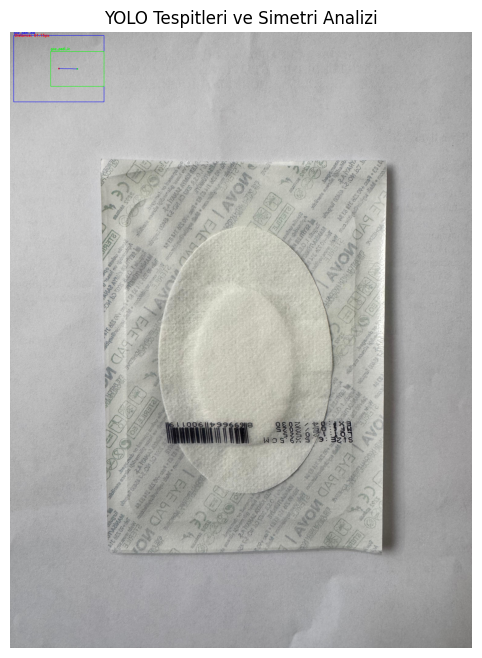

In [72]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Görüntü ve kutu bilgileri
image_path = "/content/pad_paketli.jpg"
outer_box = [24.5, 22.0, 591.2, 435.0]  # x, y, w, h
inner_box = [266.14, 127.09, 349.56, 228.54]  # x, y, w, h

# Görüntüyü yükle
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
drawn_img = img.copy()

# Kutu merkezlerini hesapla
def get_center(box):
    x, y, w, h = box
    return (int(x + w / 2), int(y + h / 2))

# Kutuları çiz
def draw_box(img, box, color, label):
    x, y, w, h = map(int, box)
    cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
    cv2.putText(img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

# Merkezleri çiz
center_outer = get_center(outer_box)
center_inner = get_center(inner_box)

cv2.circle(drawn_img, center_outer, 5, (255, 0, 0), -1)  # Mavi nokta
cv2.circle(drawn_img, center_inner, 5, (0, 255, 0), -1)  # Yeşil nokta
cv2.line(drawn_img, center_outer, center_inner, (0, 0, 255), 2)  # Kırmızı çizgi

# Kutu çizimleri
draw_box(drawn_img, outer_box, (0, 0, 255), "goz_pedi_dis")
draw_box(drawn_img, inner_box, (0, 255, 0), "goz_pedi_ic")

# Mesafeyi yaz
distance = 61.15
cv2.putText(drawn_img, f"Distance: {distance:.2f}px", (30, 30),
            cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

# Görüntüyü göster
plt.figure(figsize=(10, 8))
plt.imshow(drawn_img)
plt.title("YOLO Tespitleri ve Simetri Analizi")
plt.axis('off')
plt.show()



image 1/1 /content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 27.9ms
Speed: 30.6ms preprocess, 27.9ms inference, 10.3ms postprocess per image at shape (1, 3, 640, 640)


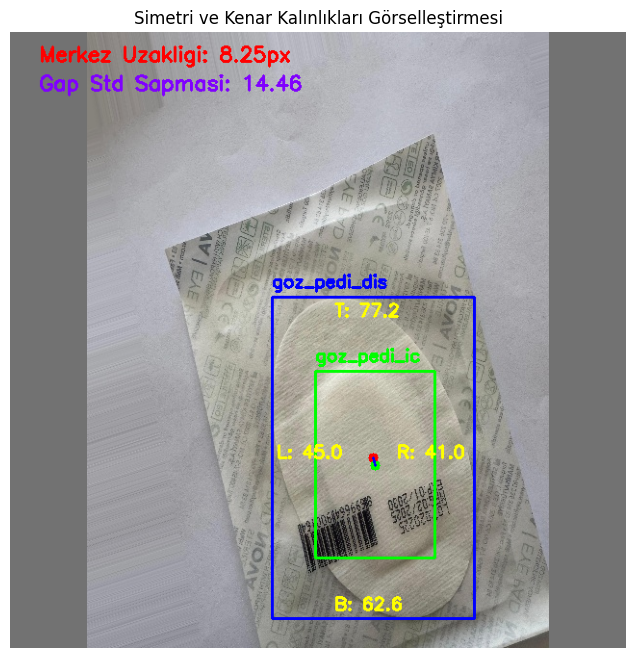

In [77]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 🔹 Model ve görsel
model = YOLO("/content/yolov8_model.pt")  # kendi yolunu yaz
image_path = "/content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg"

# 🔹 Görseli yükle ve kopyala
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
drawn_img = img.copy()

# 🔹 YOLO tahmini
results = model(image_path)[0]

# 🔹 Kutu ayıklama
inner_box, outer_box = None, None

for box in results.boxes:
    cls = int(box.cls[0].item())
    label = model.names[cls].lower()
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    box_data = [x1, y1, x2 - x1, y2 - y1]  # [x, y, w, h]

    if label == "goz_pedi_ic":
        inner_box = box_data
    elif label == "goz_pedi_dis":
        outer_box = box_data

if inner_box is None or outer_box is None:
    raise ValueError("Sınıflar bulunamadı: goz_pedi_ic ve goz_pedi_dis")

# 🔹 Yardımcı fonksiyonlar
def get_center(box):
    x, y, w, h = box
    return (int(x + w / 2), int(y + h / 2))

def draw_box(img, box, color, label):
    x, y, w, h = map(int, box)
    cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
    cv2.putText(img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

# 🔹 Merkezler
center_outer = get_center(outer_box)
center_inner = get_center(inner_box)

cv2.circle(drawn_img, center_outer, 5, (255, 0, 0), -1)
cv2.circle(drawn_img, center_inner, 5, (0, 255, 0), -1)
cv2.line(drawn_img, center_outer, center_inner, (0, 0, 255), 2)

# 🔹 Kutular
draw_box(drawn_img, outer_box, (0, 0, 255), "goz_pedi_dis")
draw_box(drawn_img, inner_box, (0, 255, 0), "goz_pedi_ic")

# 🔹 Hesaplamalar
distance = np.linalg.norm(np.array(center_outer) - np.array(center_inner))
ox, oy, ow, oh = outer_box
ix, iy, iw, ih = inner_box

gaps = {
    'left_gap': ix - ox,
    'right_gap': (ox + ow) - (ix + iw),
    'top_gap': iy - oy,
    'bottom_gap': (oy + oh) - (iy + ih)
}
gap_std = np.std(list(gaps.values()))

# 🔹 Yazılar
cv2.putText(drawn_img, f"Merkez Uzakligi: {distance:.2f}px", (30, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)
cv2.putText(drawn_img, f"Gap Std Sapmasi: {gap_std:.2f}", (30, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (128, 0, 255), 2)

# 🔹 Kenar yazıları
cv2.putText(drawn_img, f"L: {gaps['left_gap']:.1f}", (int(ox + 5), int(oy + oh / 2)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
cv2.putText(drawn_img, f"R: {gaps['right_gap']:.1f}", (int(ox + ow - 80), int(oy + oh / 2)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
cv2.putText(drawn_img, f"T: {gaps['top_gap']:.1f}", (int(ox + ow / 2 - 40), int(oy + 20)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
cv2.putText(drawn_img, f"B: {gaps['bottom_gap']:.1f}", (int(ox + ow / 2 - 40), int(oy + oh - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

# 🔹 Görseli Göster
plt.figure(figsize=(12, 8))
plt.imshow(drawn_img)
plt.title("Simetri ve Kenar Kalınlıkları Görselleştirmesi")
plt.axis('off')
plt.show()



image 1/1 /content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


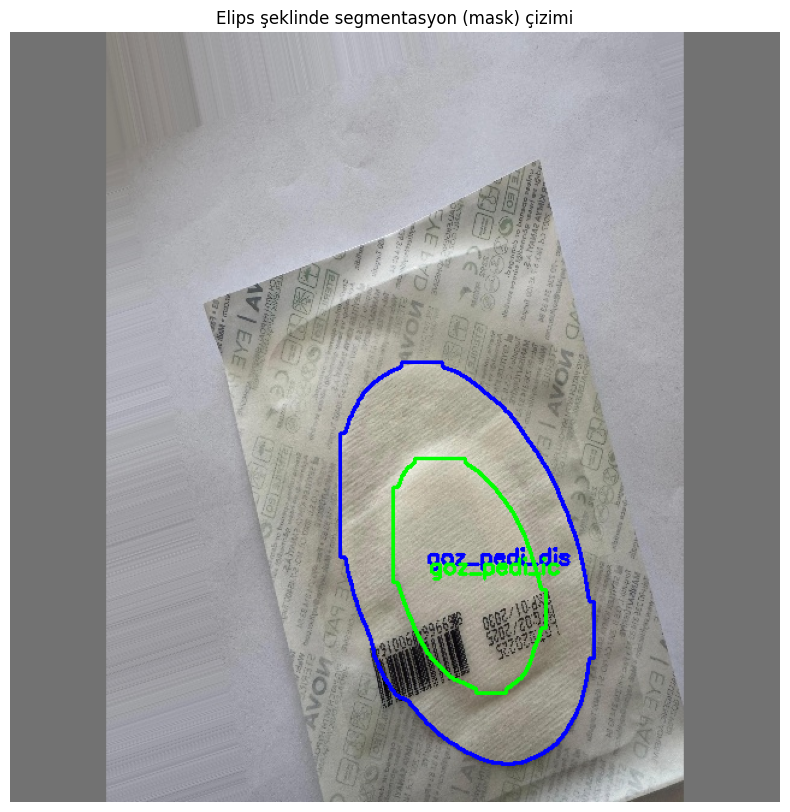

In [79]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Modeli yükle
model = YOLO("/content/yolov8_model.pt")  # segmentasyonla eğitilmiş YOLOv8 model

# Görseli yükle ve tahmin et
image_path = "/content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg"
results = model(image_path, conf=0.3)[0]

# Görseli aç
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
drawn_img = img.copy()

# Renk tanımları
color_map = {
    "goz_pedi_ic": (0, 255, 0),  # yeşil
    "goz_pedi_dis": (0, 0, 255)  # kırmızı
}

# Segment maskeleri ve sınıf adları
masks = results.masks
if masks is None:
    raise ValueError("Bu tahminde segmentasyon maskesi yok. Modeliniz segment modeli mi?")

for i, mask in enumerate(masks.data):
    class_id = int(results.boxes.cls[i].item())
    label = model.names[class_id]
    color = color_map.get(label, (255, 255, 0))

    # Maskeyi numpy'a çevir
    binary_mask = (mask.cpu().numpy() * 255).astype(np.uint8)

    # Kontur bul
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        # Konturu çiz
        cv2.drawContours(drawn_img, [cnt], -1, color, 2)
        # Opsiyonel: label ekle
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            cv2.putText(drawn_img, label, (cx - 30, cy), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

# Göster
plt.figure(figsize=(10, 10))
plt.imshow(drawn_img)
plt.axis('off')
plt.title("Elips şeklinde segmentasyon (mask) çizimi")
plt.show()



image 1/1 /content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg: 640x640 1 goz_pedi_dis, 1 goz_pedi_ic, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


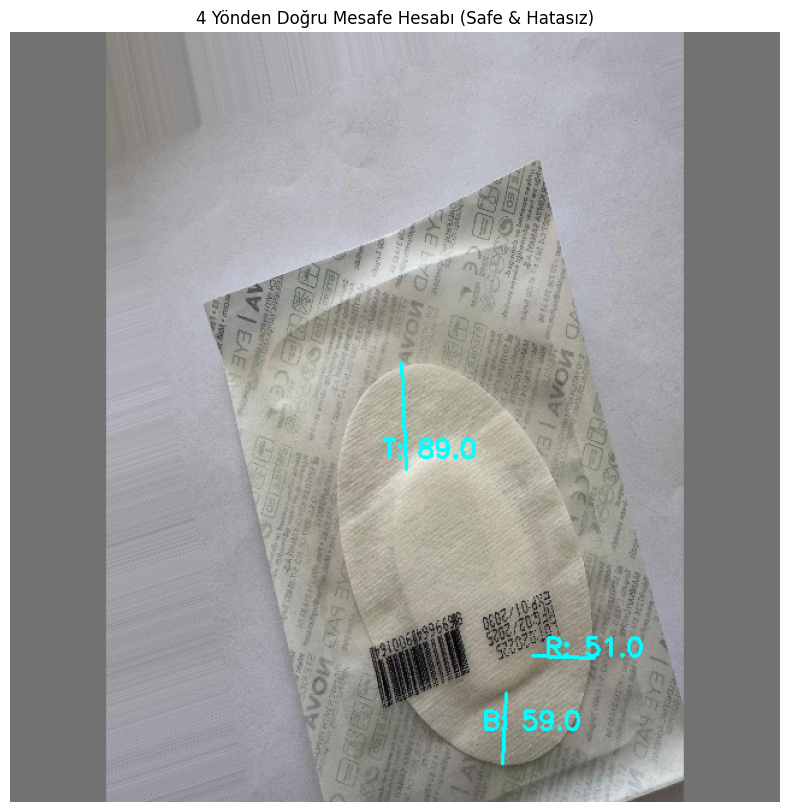

In [86]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 📥 Model ve görsel
model = YOLO("/content/yolov8_model.pt")
image_path = "/content/datasets/goz_pedi/test/images/WhatsApp Image 2025-05-21 at 15_0_2957.jpg"


# 🔍 YOLO tahmini
results = model(image_path, conf=0.3, task="segment")[0]
masks = results.masks
if masks is None:
    raise ValueError("Segmentasyon maskesi bulunamadı.")

# 🔹 Görseli yükle
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
drawn_img = img.copy()

# 🔄 Contour verisi
mask_info = {}
for i, mask in enumerate(masks.data):
    cls = int(results.boxes.cls[i].item())
    label = results.names[cls]
    binary = (mask.cpu().numpy() * 255).astype(np.uint8)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        cnt = max(contours, key=cv2.contourArea)
        mask_info[label] = cnt

# 🧠 Uç noktalar
def get_extreme_points(contour):
    xs = contour[:, 0, 0]
    ys = contour[:, 0, 1]
    left = contour[np.argmin(xs)][0]
    right = contour[np.argmax(xs)][0]
    top = contour[np.argmin(ys)][0]
    bottom = contour[np.argmax(ys)][0]
    return left, right, top, bottom

# 🔄 Aynı hizadaki en yakın nokta
def find_closest_aligned(pivot, target_contour, axis='x', tol=5):
    px, py = pivot
    if axis == 'x':  # dikey hizalama (L-R)
        candidates = [pt[0] for pt in target_contour if abs(pt[0][1] - py) <= tol]
        return min(candidates, key=lambda pt: abs(pt[0] - px), default=None)
    else:  # yatay hizalama (T-B)
        candidates = [pt[0] for pt in target_contour if abs(pt[0][0] - px) <= tol]
        return min(candidates, key=lambda pt: abs(pt[1] - py), default=None)

# 🔍 Mesafe çizimleri
if "goz_pedi_ic" in mask_info and "goz_pedi_dis" in mask_info:
    cnt_ic = mask_info["goz_pedi_ic"]
    cnt_dis = mask_info["goz_pedi_dis"]

    dis_left, dis_right, dis_top, dis_bottom = get_extreme_points(cnt_dis)
    font = cv2.FONT_HERSHEY_SIMPLEX

    # ⬅️ Sol
    pt_ic_left = find_closest_aligned(dis_left, cnt_ic, axis='x')
    if pt_ic_left is not None:
        cv2.line(drawn_img, tuple(dis_left), pt_ic_left, (0, 255, 255), 2)
        cv2.putText(drawn_img, f"L: {pt_ic_left[0] - dis_left[0]:.1f}", (pt_ic_left[0]-60, pt_ic_left[1]), font, 0.7, (0, 255, 255), 2)

    # ➡️ Sağ
    pt_ic_right = find_closest_aligned(dis_right, cnt_ic, axis='x')
    if pt_ic_right is not None:
        cv2.line(drawn_img, tuple(dis_right), pt_ic_right, (0, 255, 255), 2)
        cv2.putText(drawn_img, f"R: {dis_right[0] - pt_ic_right[0]:.1f}", (pt_ic_right[0]+10, pt_ic_right[1]), font, 0.7, (0, 255, 255), 2)

    # ⬆️ Üst
    pt_ic_top = find_closest_aligned(dis_top, cnt_ic, axis='y')
    if pt_ic_top is not None:
        cv2.line(drawn_img, tuple(dis_top), pt_ic_top, (0, 255, 255), 2)
        cv2.putText(drawn_img, f"T: {pt_ic_top[1] - dis_top[1]:.1f}", (pt_ic_top[0]-20, pt_ic_top[1]-10), font, 0.7, (0, 255, 255), 2)

    # ⬇️ Alt
    pt_ic_bottom = find_closest_aligned(dis_bottom, cnt_ic, axis='y')
    if pt_ic_bottom is not None:
        cv2.line(drawn_img, tuple(dis_bottom), pt_ic_bottom, (0, 255, 255), 2)
        cv2.putText(drawn_img, f"B: {dis_bottom[1] - pt_ic_bottom[1]:.1f}", (pt_ic_bottom[0]-20, pt_ic_bottom[1]+30), font, 0.7, (0, 255, 255), 2)

# 📊 Görselleştir
plt.figure(figsize=(10, 10))
plt.imshow(drawn_img)
plt.title("4 Yönden Doğru Mesafe Hesabı (Safe & Hatasız)")
plt.axis("off")
plt.show()

